# Single-cell epigenomics reveals mechanisms of human cortical development

Done by Vladislav Vlasov, r0822900.

## Introduction into biological system

Historically, we have been classifying based on the various metrics ranging from morphological to physiological. In recent years, the advances in the single-cell sequencing allows us to start cell profiling based on the gene expression patterns that arise in different cell populations within brain. This allows us to expend our understanding of the underlying mechanisms that are responsible for the developmental processes, tumor formation, and regulatory machinery.

In particular, in this work we analyze the data derived from the cortical organoids. This organoids come from three different hPSC cell lines (H1, H28126, 13234) on the 9th week of development. Samples derived from 13234 cell line also subjected to three different conditions: treatment with vitamin A, treatment without vitamin A, and treatment with potent inhibitor of cytosol ALDH1 DEAB. We will perform general analyzes to establish cell types present in this samples using standard Seurat pipeline and proceed to analyze differential expression between different treatments of 13234 samples.

We are following this [paper](https://www.nature.com/articles/s41586-021-03209-8) published in Nature, which primary focus is the epigenetic aspect of the developmental processes within human cortex. The single-cell RNA sequencing data was used as a supplementary to the scATAC-seq data, which we will analyze in the second project.

Raw data is available on the [NeMO archive](https://assets.nemoarchive.org/dat-gnot1gb) but we will skip the part where researchers were generating count matrices using 10X's Cell Ranger, and start with the already preprocessed outputs in form of count matrices. They are available at [NCBI GEO](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE163018).

## Preparation

In this step I set up my working directory, downloading necessary files, unpacking them, and loading necessary modules.

In [1]:
options(warn = -1)

In [2]:
system("mkdir /mnt/storage/r0822900/project1")
setwd("~/atacseq")

In [3]:
system("wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE163nnn/GSE163018/suppl/GSE163018_RAW.tar")

In [4]:
system("tar -xf GSE163018_RAW.tar")

In [5]:
list.files()

[1] "GSE163018_RAW.tar"                                               
 [2] "GSM4970295_organoid_13234_9week_metadata.csv.gz"                 
 [3] "GSM4970295_organoid_13234_9week.snap.gz"                         
 [4] "GSM4970295_organoid_scATAC_allsamples_batchcorrected_snap.rds.gz"
 [5] "GSM4970296_organoid_H28126_9week_metadata.csv.gz"                
 [6] "GSM4970296_organoid_H28126_9week.snap.gz"                        
 [7] "GSM4970297_organoid_H1_9week_metadata.csv.gz"                    
 [8] "GSM4970297_organoid_H1_9week.snap.gz"                            
 [9] "GSM4970298_organoid_H28126_scRNA_barcodes.tsv.gz"                
[10] "GSM4970298_organoid_H28126_scRNA_features.tsv.gz"                
[11] "GSM4970298_organoid_H28126_scRNA_matrix.mtx.gz"                  
[12] "GSM4970299_organoid_H1_scRNA_barcodes.tsv.gz"                    
[13] "GSM4970299_organoid_H1_scRNA_features.tsv.gz"                    
[14] "GSM4970299_organoid_H1_scRNA_matrix.mtx.gz"                      
[15] "GSM4970300_organoid_13234_17week_metadata.csv.gz"                
[16] "GSM4970300_organoid_13234_17week.snap.gz"                        
[17] "GSM4970301_organoid_H28126_24week_metadata.csv.gz"               
[18] "GSM4970301_organoid_H28126_24week.snap.gz"                       
[19] "GSM4970302_org_VitACtrlDEAB_well1_barcodes.tsv.gz"               
[20] "GSM4970302_org_VitACtrlDEAB_well1_features.tsv.gz"               
[21] "GSM4970302_org_VitACtrlDEAB_well1_matrix.mtx.gz"                 
[22] "GSM4970302_organoid_VitACtrlDEAB_SeuratObject.rds.gz"            
[23] "GSM4970303_org_VitACtrlDEAB_well2_barcodes.tsv.gz"               
[24] "GSM4970303_org_VitACtrlDEAB_well2_features.tsv.gz"               
[25] "GSM4970303_org_VitACtrlDEAB_well2_matrix.mtx.gz"                 
[26] "GSM4970304_org_VitACtrlDEAB_well3_barcodes.tsv.gz"               
[27] "GSM4970304_org_VitACtrlDEAB_well3_features.tsv.gz"               
[28] "GSM4970304_org_VitACtrlDEAB_well3_matrix.mtx.gz"

In [6]:
# Single-cell analysis
library(Seurat)
library(SingleCellExperiment)
library(SingleR)
library(celldex)

# DE analysis
library(DESeq2)

# Functional analysis
library(topGO)
library(ALL)
data(ALL)
affyLib <- paste(annotation(ALL), "db", sep = ".")
library(package = affyLib, character.only = TRUE)
library(clusterProfiler)

# Utulities
library(dplyr)
library(tibble)
library(tidyr)
library(Matrix)

# Visualization
library(gridExtra)
library(ggplot2)
library(cowplot)
library(hexbin)
library(vsn)
library(pheatmap)
library(Rgraphviz)

Attaching SeuratObject

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds,

## Pipeline

### Data Import

Here we load single-cell datasets as Seurat object for downstream analysis. For now, we are not going to merge them into one object but rather just store in the list.

In [7]:
get_Seurat_object <- function(path, project) {
    
    cell_ids <- read.table(file = paste(path, "barcodes.tsv.gz", sep = "_"), sep = "\t", header = FALSE)$V1
    gene_ids <- read.table(file = paste(path, "features.tsv.gz", sep = "_"), sep = "\t", header = FALSE)$V2
    counts <- readMM(paste(path, "matrix.mtx.gz", sep = "_"))

    rownames(counts) <- gene_ids
    colnames(counts) <- cell_ids
    
    return (CreateSeuratObject(counts = counts, min.cells = 3, min.features = 200, project = project))
}

In [8]:
H28126 <- get_Seurat_object("GSM4970298_organoid_H28126_scRNA", "H28126")
H1 <- get_Seurat_object("GSM4970299_organoid_H1_scRNA", "H1")
vitA <- get_Seurat_object("GSM4970302_org_VitACtrlDEAB_well1", "vitA")
noVitA <- get_Seurat_object("GSM4970303_org_VitACtrlDEAB_well2", "noVitA")
deab <- get_Seurat_object("GSM4970304_org_VitACtrlDEAB_well3", "deab")

In [9]:
datasets <- c(H28126, H1, vitA, noVitA, deab)

### Quality Control

In this part, we would like to focus on the quality control of our samples. First of all, we will calculate the percentage of mitochondrial genes per cell nad larger genes. This data will be added to metadata of Seurat object so that we can work with it later. It's important to know this characteristics since the percentage of mitochondrial genes can tell us about possible loss of cytoplasmic RNA, low-quality or cells undergoing cellular death. High proportion of data dominated by a single gene can be telling us that something is wrong with the dataset.

As mentioned before, this metadata will be useful when it comes to filtering cells from the datasets.

In [10]:
qc_metrics <- function(data) {
    data$percent.MT <- PercentageFeatureSet(data, pattern = "^MT-")
    data$Percent.Largest.Gene <- apply(data@assays$RNA@counts, 2, function(x) {(100 * max(x)) / sum(x)})
    return (data)
}

In [11]:
datasets <- lapply(datasets, qc_metrics)

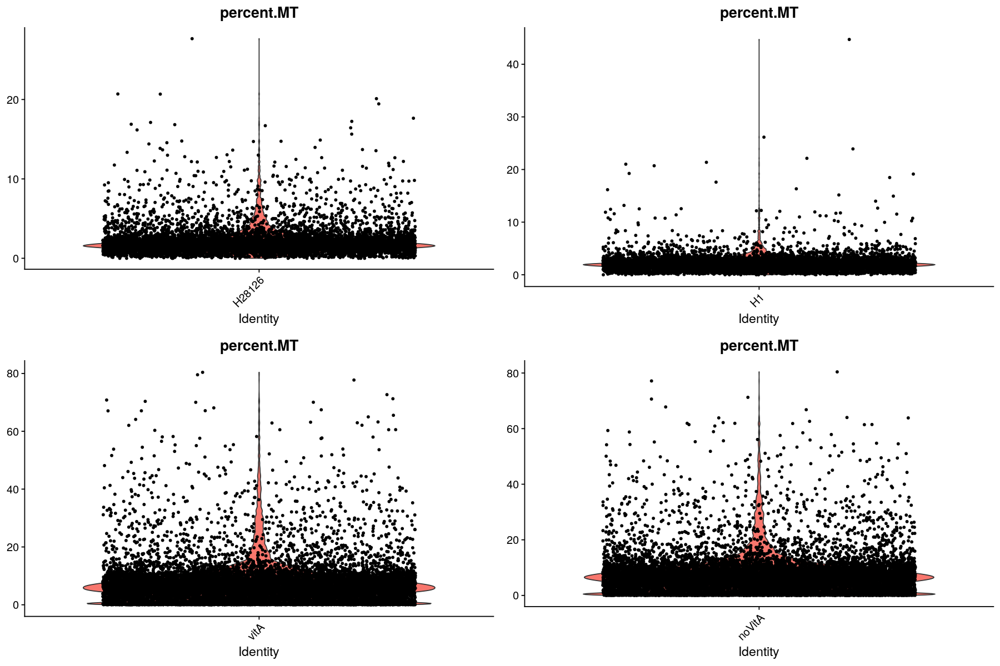

In [12]:
options(repr.plot.width = 15, repr.plot.height = 10)

plot_1 <- VlnPlot(datasets[[1]], features = c("nCount_RNA", "percent.MT"))
plot_2 <- VlnPlot(datasets[[2]], features = c("nCount_RNA", "percent.MT"))
plot_3 <- VlnPlot(datasets[[3]], features = c("nCount_RNA", "percent.MT"))
plot_4 <- VlnPlot(datasets[[4]], features = c("nCount_RNA", "percent.MT"))

grid.arrange(plot_1, plot_2, plot_3, plot_4, ncol = 2, nrow = 2)

On the violin plots above we can see that the first to datasets express relatively small amount of mitochondrial genes compare to the last two, where the percentage for big number of cells is quite high.

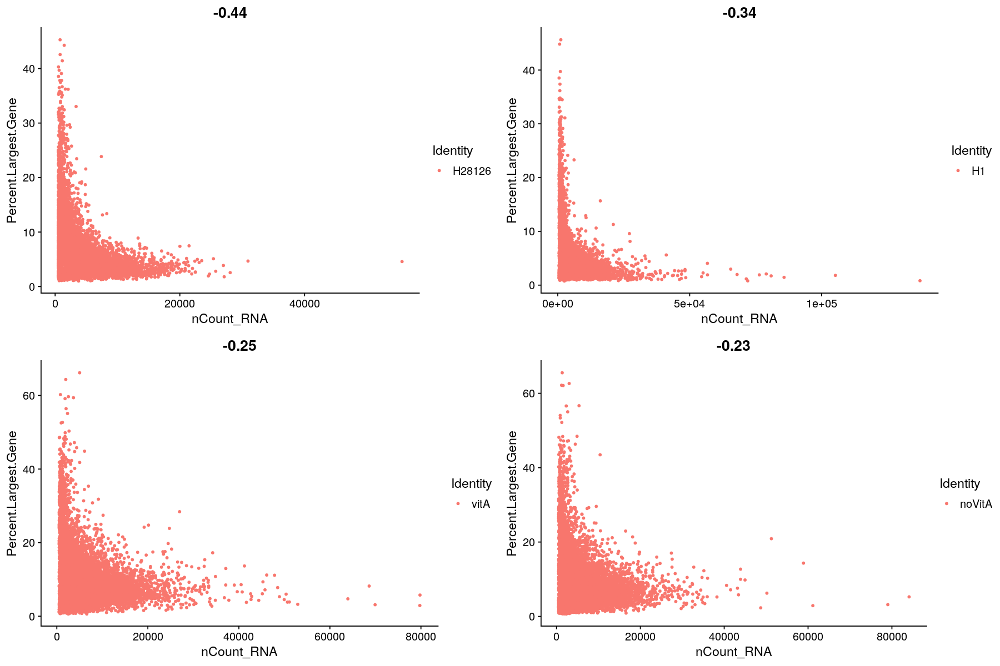

In [13]:
options(repr.plot.width = 15, repr.plot.height = 10)

plot_1 <- FeatureScatter(datasets[[1]], feature1 = "nCount_RNA", feature2 = "Percent.Largest.Gene")
plot_2 <- FeatureScatter(datasets[[2]], feature1 = "nCount_RNA", feature2 = "Percent.Largest.Gene")
plot_3 <- FeatureScatter(datasets[[3]], feature1 = "nCount_RNA", feature2 = "Percent.Largest.Gene")
plot_4 <- FeatureScatter(datasets[[4]], feature1 = "nCount_RNA", feature2 = "Percent.Largest.Gene")

grid.arrange(plot_1, plot_2, plot_3, plot_4, ncol = 2, nrow = 2)

Here we use scatter plot to visualize the relationship between UMIs and percentage of largest genes. From the plots above we can see similar trends as with the % of mitochondrial genes: third and forth samples have cells with higher number of large genes.

Let's use `ggplot2` library to plot essential QC metrix and arrange them together in one plot for first two samples.

In [14]:
plot_metrics <- function(data) {
    
    qc.metrics <- as_tibble(data[[c("nCount_RNA", "nFeature_RNA", "percent.MT", "Percent.Largest.Gene")]], 
                            rownames = "Cell.Barcode")
    
    plot_1 <- qc.metrics %>%
        arrange(percent.MT) %>%
            ggplot(aes(nCount_RNA, nFeature_RNA, colour = percent.MT)) +
                geom_point() +
                scale_color_gradientn(colors = c("black", "blue", "green2", "red", "yellow")) +
                theme_classic()

    plot_2 <- qc.metrics %>%
        ggplot(aes(percent.MT)) + 
            geom_histogram(binwidth = 0.5, fill = "yellow", colour = "black") +
            ggtitle("Distribution of Percentage Mitochondrion") +
            theme_classic()

    plot_3 <- qc.metrics %>%
        ggplot(aes(Percent.Largest.Gene)) + 
            geom_histogram(binwidth = 0.7, fill = "yellow", colour = "black") +
            ggtitle("Distribution of Percentage Largest Gene") +
            theme_classic()
    
    return (list(plot_1, plot_2, plot_3))
}

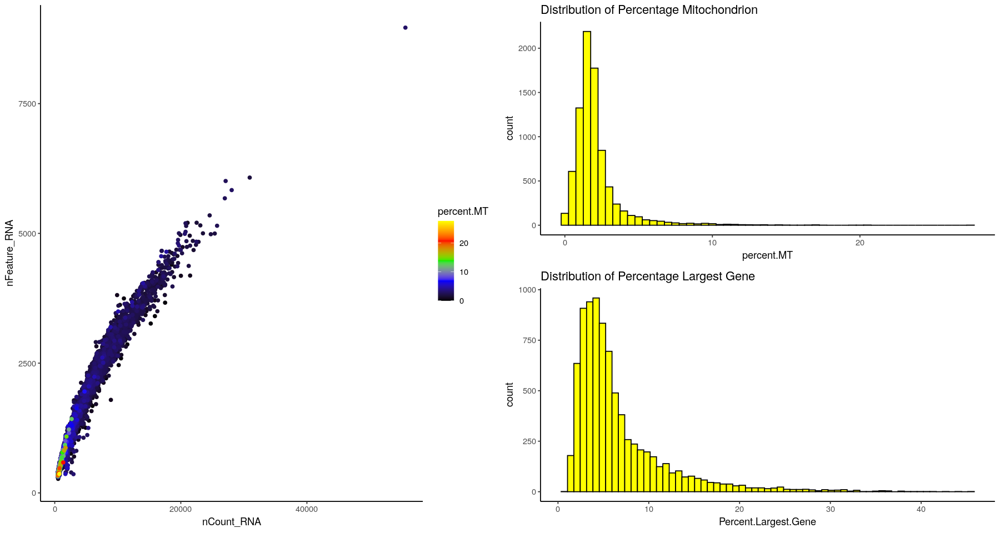

In [15]:
options(repr.plot.width = 15, repr.plot.height = 8)

plots_H28126 <- plot_metrics(datasets[[1]])

grid.arrange(plots_H28126[[1]], arrangeGrob(plots_H28126[[2]], plots_H28126[[3]]), ncol = 2, widths = c(4, 4))

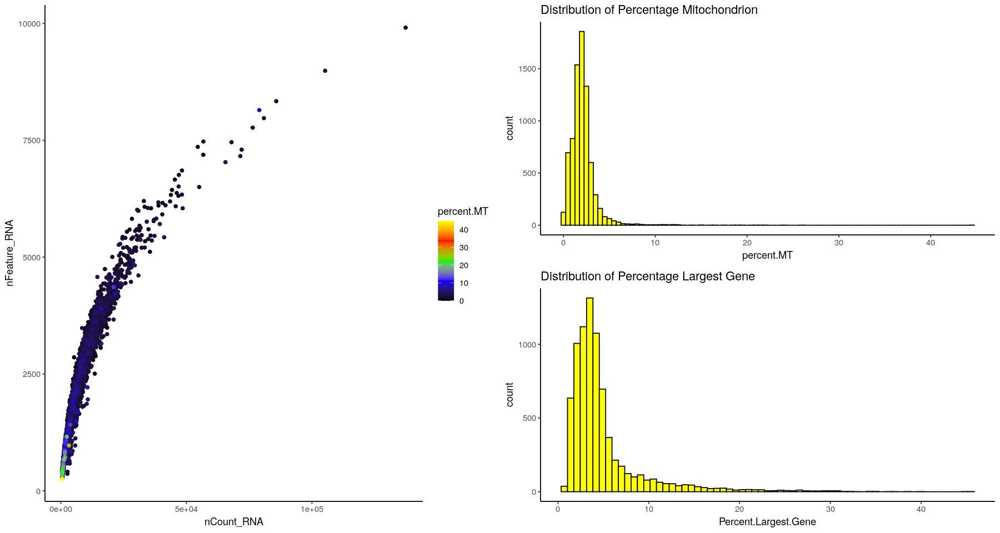

In [16]:
options(repr.plot.width = 15, repr.plot.height = 8)

plots_H1 <- plot_metrics(datasets[[2]])

grid.arrange(plots_H1[[1]], arrangeGrob(plots_H1[[2]], plots_H1[[3]]), ncol = 2, widths = c(4, 4))

Ideally, the relationship between features and counts should follow linear trend. As for the distributions, we can see that they follow F-distribution.

### Filtering

Before continuing our analysis, we need to filter our datasets to reduce amount of low-quality cells within them. We will keep the cells which mitochondrial gene expression is less than 10%, 20% of largest genes, and RNA count is between 750 and 2000 per cell.

In [17]:
filter <- function(data, rna_min = 750, rnna_max = 2000) {
    data <- subset(data, nFeature_RNA > rna_min & nFeature_RNA < rnna_max & percent.MT < 10 & Percent.Largest.Gene < 20)
    return (data)
}

In [18]:
datasets <- lapply(datasets, filter)

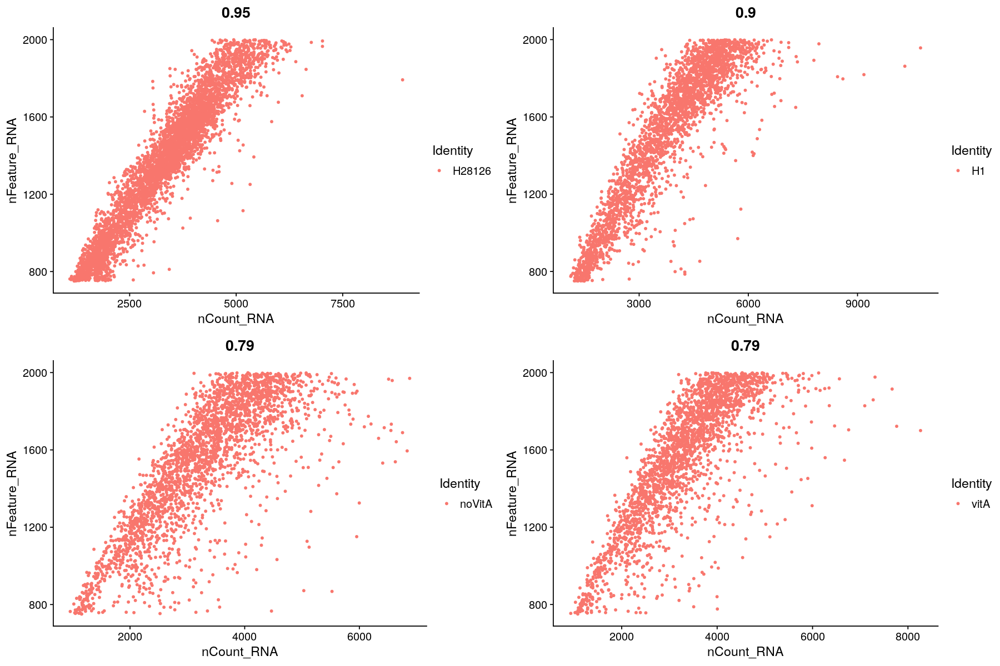

In [19]:
options(repr.plot.width = 15, repr.plot.height = 10)

plot_1 <- FeatureScatter(datasets[[1]], feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot_2 <- FeatureScatter(datasets[[2]], feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot_4 <- FeatureScatter(datasets[[3]], feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot_3 <- FeatureScatter(datasets[[4]], feature1 = "nCount_RNA", feature2 = "nFeature_RNA")

grid.arrange(plot_1, plot_2, plot_3, plot_4, ncol = 2, nrow = 2)

Above we can see the relationship between features and counts and RNA. Now they follow linear trend, but samples 3 and 4 have quite big dispersion.

### Variable Features

Important step before starting with dimensional reduction is to filter the features that are not going to be informative. We will define this genes by their expression.

In [20]:
variable <- function(data) {
    data <- FindVariableFeatures(data, selection.method = "vst", nfeatures = 2000)
    return (data)   
}

In [21]:
datasets <- lapply(datasets, variable)

When using repel, set xnudge and ynudge to 0 for optimal results

When using repel, set xnudge and ynudge to 0 for optimal results

When using repel, set xnudge and ynudge to 0 for optimal results

When using repel, set xnudge and ynudge to 0 for optimal results



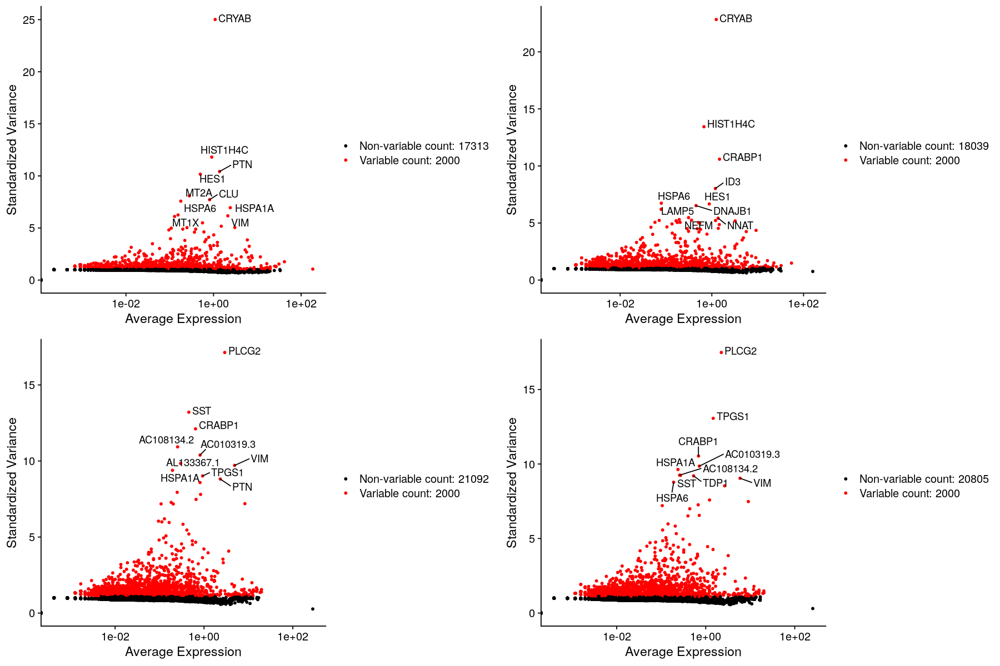

In [22]:
options(repr.plot.width = 15, repr.plot.height = 10)

plot_1 <- VariableFeaturePlot(datasets[[1]])
plot_2 <- LabelPoints(plot = plot_1, points = head(VariableFeatures(datasets[[1]]), 10), repel = TRUE)
plot_3 <- VariableFeaturePlot(datasets[[2]])
plot_4 <- LabelPoints(plot = plot_3, points = head(VariableFeatures(datasets[[2]]), 10), repel = TRUE)
plot_5 <- VariableFeaturePlot(datasets[[3]])
plot_6 <- LabelPoints(plot = plot_5, points = head(VariableFeatures(datasets[[3]]), 10), repel = TRUE)
plot_7 <- VariableFeaturePlot(datasets[[4]])
plot_8 <- LabelPoints(plot = plot_7, points = head(VariableFeatures(datasets[[4]]), 10), repel = TRUE)

grid.arrange(plot_2, plot_4, plot_6, plot_8, ncol = 2, nrow = 2)

We can already see the differences between different samples just by looking at the plots above since they contain different genes that are being overexpressed. Interestingly that the genes from the first two samples varies much since they come from different cell lines while third and fourth samples don't deviate that much from each other. Possible explanation of the difference between them can be drawn from the fact that they are being treated differently (VA against No VA).

In [23]:
plot_variation <- function(data) {
    
    variance.data <- as_tibble(HVFInfo(data), rownames = "Gene")

    variance.data <- variance.data %>% 
        mutate(hypervariable = Gene %in% VariableFeatures(data))

    plot <- variance.data %>% 
        ggplot(aes(log(mean), log(variance), color = hypervariable)) + 
            geom_point() +
            scale_color_manual(values = c("black", "red"))
    
    return (plot)
}

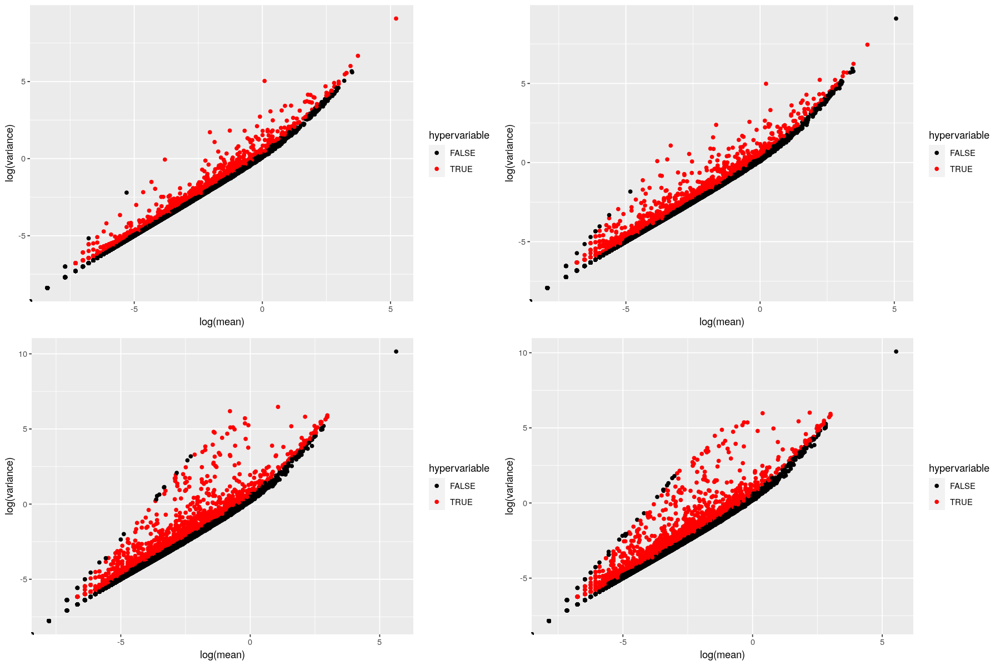

In [24]:
options(repr.plot.width = 15, repr.plot.height = 10)

plot_1 <- plot_variation(datasets[[1]])
plot_2 <- plot_variation(datasets[[2]])
plot_3 <- plot_variation(datasets[[3]])
plot_4 <- plot_variation(datasets[[4]])

grid.arrange(plot_1, plot_2, plot_3, plot_4, ncol = 2, nrow = 2)

Plots above explain relationship between mean expression and expression variance (logarithmic scale) among genes. For differential expression analysis we would assume that they will be the same and highlight them in grey on the plot.

### Normalization and Integration

In the previous steps we've looked into individual datasets. Now we will merge them together. Seurat provides dedicated method for this that account for the technical differences between samples.

First, we need to normalize our assays using `SCTransofrm` method which is based on the negative binomial regression. This method, according to the authors, is more beneficial compare to other commonly used methods since it avoids pitfalls like addition of pseudo-counts, and logarithmic transformation.

Second, we will find so called "anchors" that will help find cross-sample pairs of cells that are in the same biological state. For that we will use 3000 features.

In [25]:
datasets.normalized <- lapply(datasets, SCTransform)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15624 by 4396

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 4396 cells



  |======================================================================| 100%


Found 123 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15624 genes



  |======================================================================| 100%


Computing corrected count matrix for 15624 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.226383 mins

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 14828 by 2767

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2767 cells



  |======================================================================| 100%


Found 139 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 14828 genes



  |======================================================================| 100%


Computing corrected count matrix for 14828 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 46.14812 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15775 by 2378

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2378 cells



  |======================================================================| 100%


Found 85 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15775 genes



  |======================================================================| 100%


Computing corrected count matrix for 15775 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 39.32806 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15927 by 2570

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2570 cells



  |======================================================================| 100%


Found 97 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15927 genes



  |======================================================================| 100%


Computing corrected count matrix for 15927 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 42.55232 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15898 by 2647

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2647 cells



  |======================================================================| 100%


Found 114 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15898 genes



  |======================================================================| 100%


Computing corrected count matrix for 15898 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 44.07874 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT



In [26]:
features <- SelectIntegrationFeatures(datasets.normalized, nfeatures = 3000)

In [27]:
datasets.pre <- PrepSCTIntegration(datasets.normalized, anchor.features = features)

In [28]:
anchors <- FindIntegrationAnchors(datasets.pre, normalization.method = "SCT", anchor.features = features)
data <- IntegrateData(anchorset = anchors, normalization.method = "SCT")

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 8420 anchors

Filtering anchors

	Retained 7355 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 6911 anchors

Filtering anchors

	Retained 5560 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 5921 anchors

Filtering anchors

	Retained 5096 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 7365 anchors

Filtering anchors

	Retained 5883 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 6147 anchors

Filtering anchors

	Retained 5295 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 6378 anchors

Filtering anchors

	Retained 6110 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 7421 anchors

Filtering anchors

	Retained 5889 anchors

Running CCA

Merging objects

Fi

As the result of the integration, we have obtained the integrated dataset containing almost 45.5 thousands features with nearly fifteen thousand samples within 3 assays. In the active assay, which is `integrated`, we are dealing with 3000 features.

In [29]:
data

An object of class Seurat 
45449 features across 14758 samples within 3 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 other assays present: RNA, SCT

In [30]:
normalization_plot <- function() {
    as.tibble(data@assays$integrated@data[, 1:100]) %>%
        pivot_longer(cols = everything(), names_to = "cell", values_to = "expression") %>%
            ggplot(aes(x = expression, group = cell)) + geom_density() +
                coord_cartesian(ylim = c(0, 0.6), xlim = c(0, 3)) +
                theme_classic()
    }

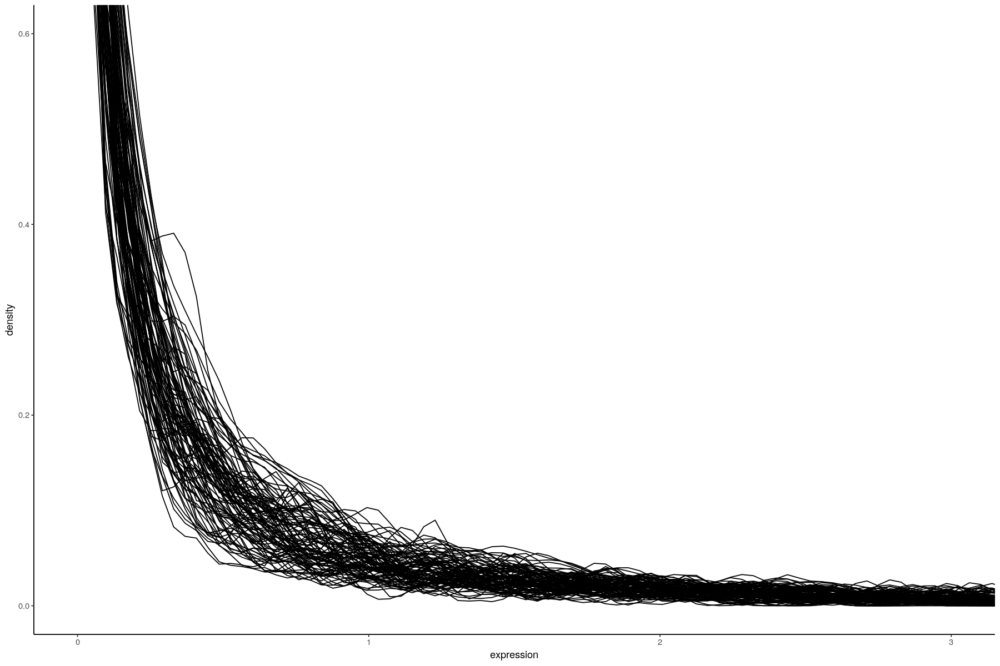

In [31]:
normalization_plot()

In the figure above we have picked first 100 cells to plot the expression density after normalization. Last step is to scale our dataset so that the mean expression would be 0 with the variance of 1.

In [32]:
data <- ScaleData(data, features = rownames(data), verbose = FALSE)

Centering and scaling data matrix



### Clustering 

#### PCA

Since we are dealing with high-dimensional dataset, we need to perform some sort of dimensionality reduction and reduce the amount of computations as well as help us understand trends in our data. Namely, based on the variance and the list of genes for every principal component, we can make conclusion about how our data tend to cluster.

In [33]:
data <- RunPCA(data, features = VariableFeatures(data))

PC_ 1 
Positive:  STMN2, GPM6A, RTN1, DCX, STMN1, NRXN1, GRIA2, GAP43, SOX4, SYT1 
	   FNBP1L, AKAP9, MAP2, MAP1B, LMO3, ANK3, MLLT11, NSG2, PCSK1N, TMSB10 
	   KIDINS220, TSPAN13, RBFOX2, BEX1, CAMK2N1, INA, CD24, SOX11, CPE, MYT1L 
Negative:  VIM, RPL41, TTYH1, RPS6, RPL12, RPS7, RPS20, CLU, RPS2, GAPDH 
	   PTN, RPS19, RPL36, TPT1, HMGB2, RPLP1, HSPB1, GNG5, MT2A, RPL13 
	   RPL13A, CD99, SOX2, YBX3, FTL, RPS27, HES1, EEF1D, PON2, SERF2 
PC_ 2 
Positive:  EIF5, EIF1, DDIT3, ATF4, TSPYL2, SNHG9, SNHG21, AL118516.1, PLCG2, MAP1LC3B 
	   TAF7, SLC3A2, HERPUD1, SNHG19, TRA2B, SPTY2D1, SF3B6, TRMT112, BUD31, FTL 
	   HSPH1, GADD45B, DNAJB1, ZFAND2A, RBM39, BRD2, RSRP1, SAP18, OAZ1, ZNF830 
Negative:  SFRP1, MT-CO2, CKB, FABP7, PTPRZ1, MT-CO1, MT-CO3, MT-ATP6, HMGB1, TUBA1B 
	   MT-ND3, C1orf61, TMSB4X, PTN, FAM181B, SYNE2, HMGN3, LINC01551, NUSAP1, MKI67 
	   TOP2A, PBK, SEPT11, TPX2, MT-ND4, MT-CYB, SLC1A3, ACTG1, CENPF, HIST1H4C 
PC_ 3 
Positive:  NUSAP1, TPX2, TOP2A, DLGAP5, PBK, MKI6

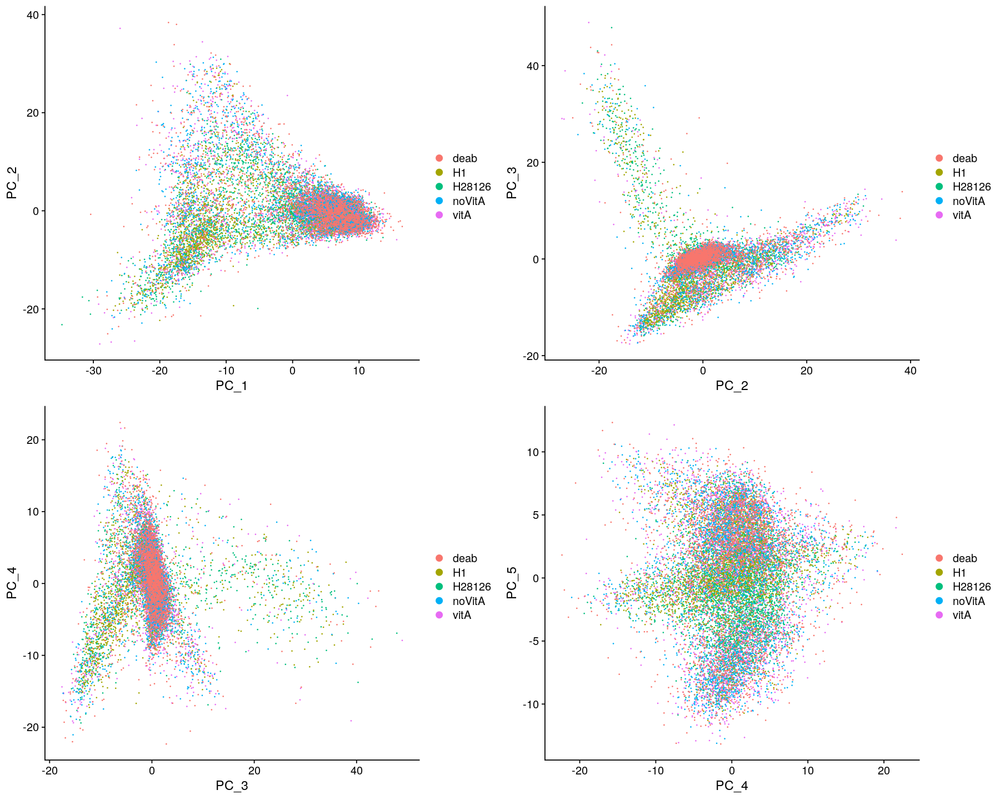

In [34]:
pc_1_2 <- DimPlot(data, reduction = "pca", dims = c(1, 2))
pc_2_3 <- DimPlot(data, reduction = "pca", dims = c(2, 3))
pc_3_4 <- DimPlot(data, reduction = "pca", dims = c(3, 4))
pc_4_5 <- DimPlot(data, reduction = "pca", dims = c(4, 5))

options(repr.plot.width = 15, repr.plot.height = 12)
grid.arrange(pc_1_2, pc_2_3, pc_3_4,  pc_4_5, ncol = 2, nrow = 2)

Due to the nature of the procedure (linearity), it's highly unsuitable for the data visualization. Instead, we will use different methods later. For now we will only use it to understand clustering.

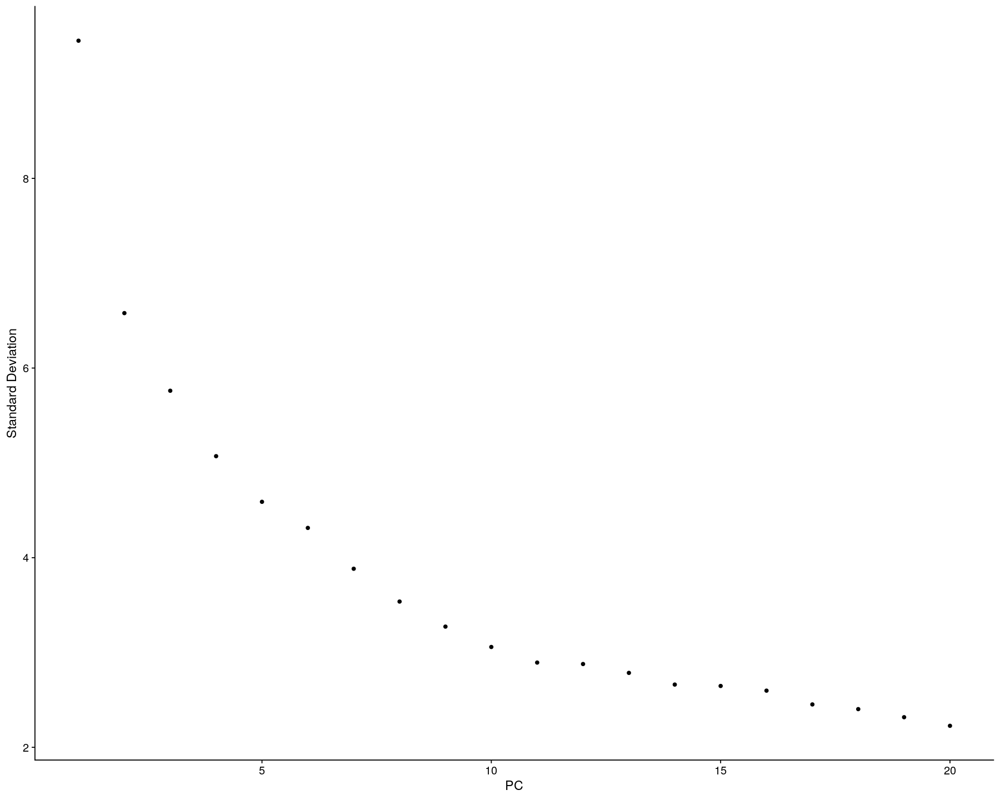

In [35]:
ElbowPlot(data)

Alright, we can see that the majority of variation in our dataset can be explained by 13-15 principal components. Let's take a look at the heatmap to understand which PCs are not very informative.

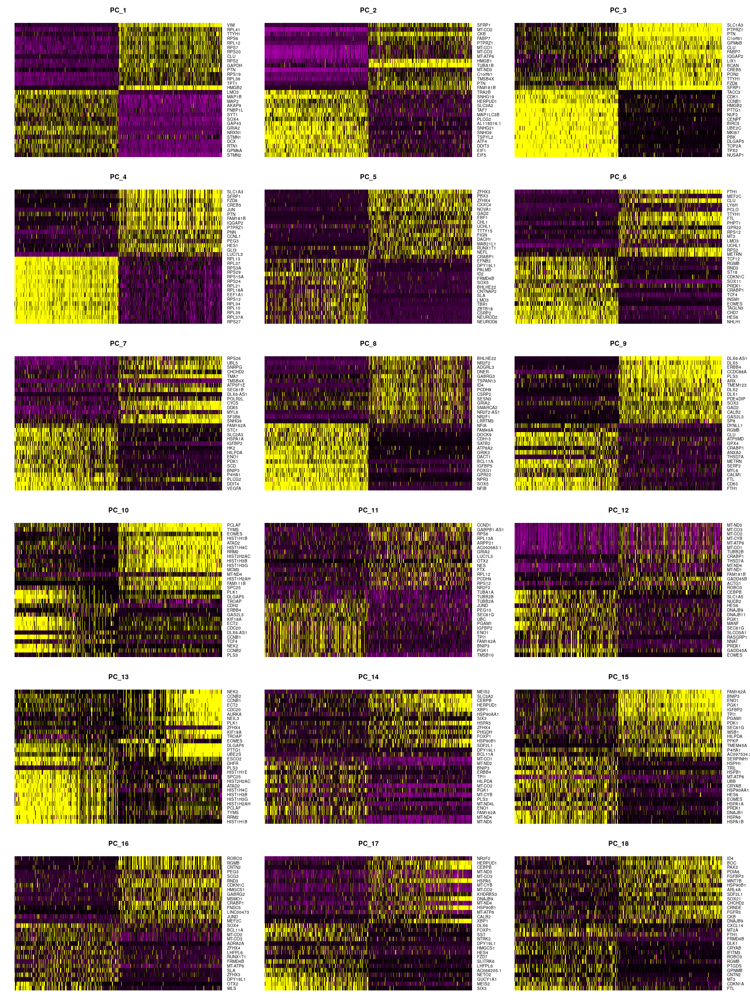

In [36]:
options(repr.plot.width = 15, repr.plot.height = 20)
DimHeatmap(data, dims = 1:18, cells = 500)

So, some of the PCs are clearly very uninformative (13, 18, for example).

#### Visualization

##### TSNE

To capture the non-linearity in our high-dimensional data with preservation of local structures within it, we can use t-stochastic neighborhood embedding. This is a major improvement over what we did in PCA visualization-wise. Unfortunately, due to the stochastic nature of the algorithm, every time we would observ slightly different results unless we set seed. Another disadvantage is that the global structures are not preserved and greatly varies depending on the value of perplexity used. While with small perplexity we will maintain small clusters, while bigger clusters will be less observable. And tSNE can be used exclusively for data visualization because unlike PCA, we can yield only 2 or 3 dimension out of it, which cannot be used for further analysis.

In [37]:
data <- RunTSNE(data, dims = 1:14, seed.use = 1, perplexity = 10)
plot_10 <- DimPlot(data,reduction = "tsne", pt.size = 1) + ggtitle("tSNE with Perplexity 10")
data <- RunTSNE(data, dims = 1:14, seed.use = 1, perplexity = 50)
plot_50 <- DimPlot(data,reduction = "tsne", pt.size = 1) + ggtitle("tSNE with Perplexity 50")
data <- RunTSNE(data, dims = 1:14, seed.use = 1, perplexity = 100)
plot_100 <- DimPlot(data,reduction = "tsne", pt.size = 1) + ggtitle("tSNE with Perplexity 100")
data <- RunTSNE(data, dims = 1:14, seed.use = 1, perplexity = 300)
plot_300 <- DimPlot(data,reduction = "tsne", pt.size = 1) + ggtitle("tSNE with Perplexity 300")

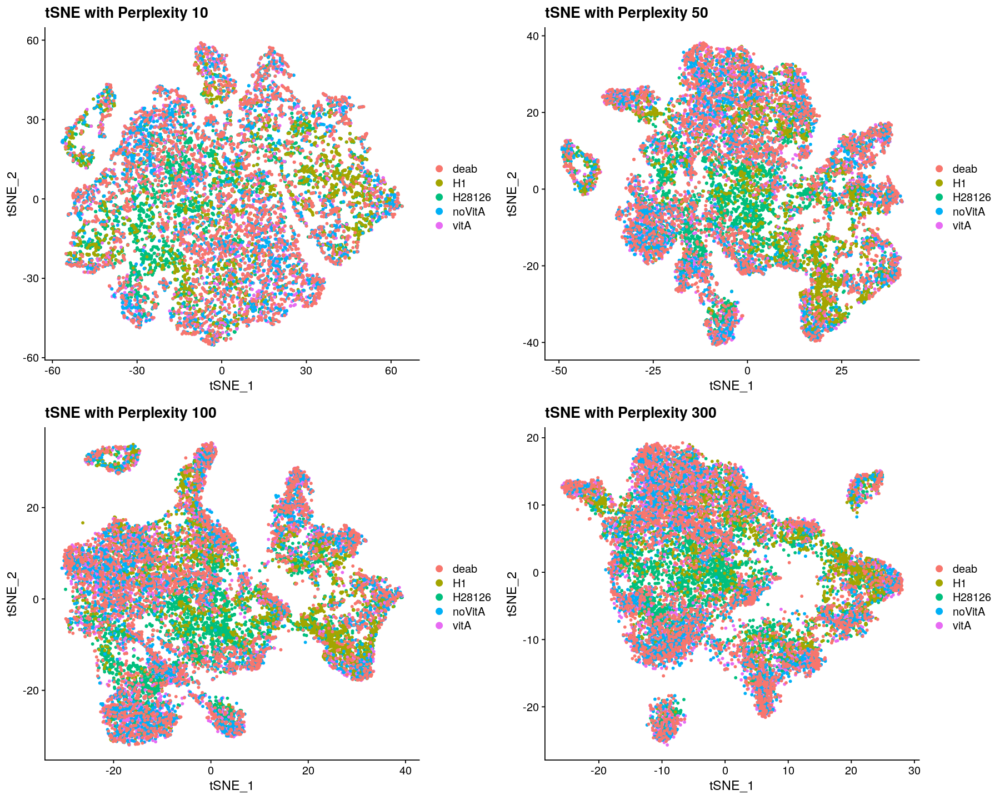

In [38]:
options(repr.plot.width = 15, repr.plot.height = 12)
grid.arrange(plot_10, plot_50, plot_100, plot_300, ncol = 2, nrow = 2)

We can see on every single plot above distinctive clusters that very in size and complexity as well as the overlaps between different datasets, which can suggest the presence of unique cell populations among them. Let's stick with the tSNE with perplexity 50 since it seems to be the most informative.

In [39]:
data <- RunTSNE(data, dims = 1:14, seed.use = 1, perplexity = 50)

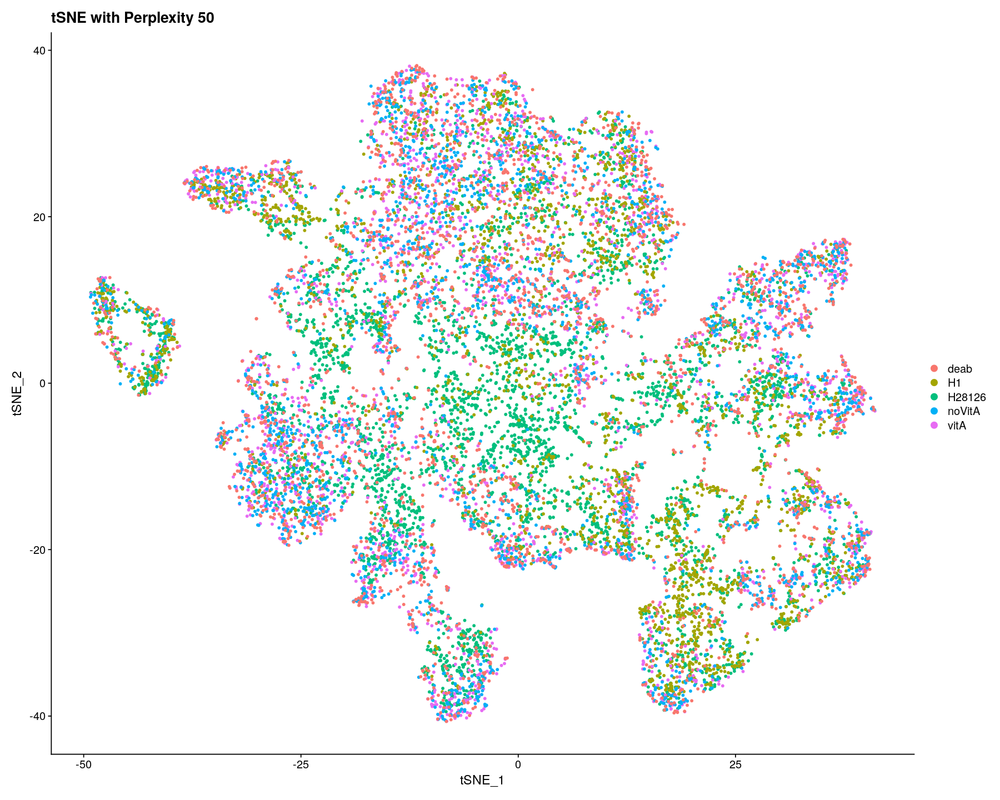

In [40]:
DimPlot(data,reduction = "tsne", pt.size = 1) + ggtitle("tSNE with Perplexity 50")

##### UMAP

Another technique that we can use is the uniform manifold approximation and projection, which is principally similar to tSNE since they both construct high dimensional graph representation followed by optimization of low-dimensional graph to be as similar as possible to high dimensional one. Unlike tSNE, UMAP preserves the global structures and can be further used in downstream analysis such as clustering algorithms.

In [41]:
data <- RunUMAP(data, dims = 1:14, verbose = FALSE)

16:10:58 UMAP embedding parameters a = 0.9922 b = 1.112

16:10:58 Read 14758 rows and found 14 numeric columns

16:10:58 Using Annoy for neighbor search, n_neighbors = 30

16:10:58 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

16:11:00 Writing NN index file to temp file /tmp/Rtmp8bwLb5/file117cdc4f7b3e90

16:11:00 Searching Annoy index using 1 thread, search_k = 3000

16:11:05 Annoy recall = 100%

16:11:06 Commencing smooth kNN distance calibration using 1 thread

16:11:06 Initializing from normalized Laplacian + noise

16:11:07 Commencing optimization for 200 epochs, with 639438 positive edges

16:11:13 Optimization finished



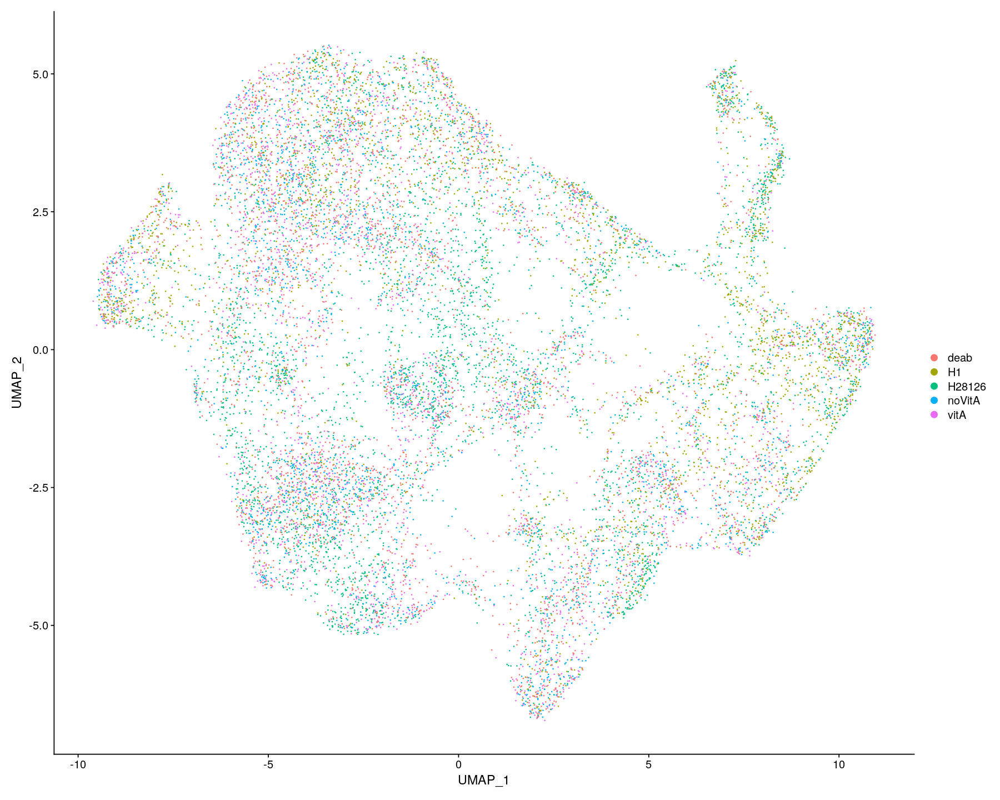

In [42]:
DimPlot(data, reduction = "umap")

#### Defining Clusters

With the low-dimensional representation of our data we were making guess regarding clusters, but now we will actually compute them using function `FindNeighbors` from the Seurat package, which is graph based k nearest  neighbors classifier. We specify reduction dimensions from 1 to 14 based on the previous analysis with PCs.

In [43]:
data <- FindNeighbors(data, dims = 1:14, verbose = FALSE)

Computing nearest neighbor graph

Computing SNN



In [44]:
data <- FindClusters(data, resolution = 0.5)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14758
Number of edges: 532609

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8915
Number of communities: 14
Elapsed time: 1 seconds


After running two functions above we obtained 14 communities. Let's visualize them with both tSNE and UMAP.

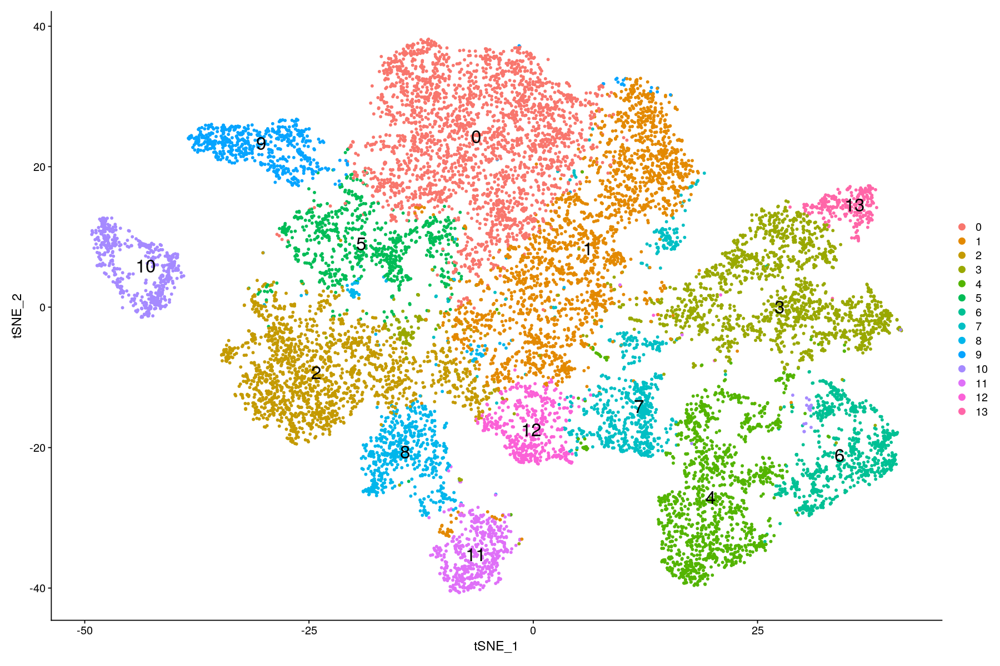

In [45]:
options(repr.plot.width = 15, repr.plot.height = 10)
DimPlot(data, reduction = "tsne", pt.size = 1, label = TRUE, label.size = 7)

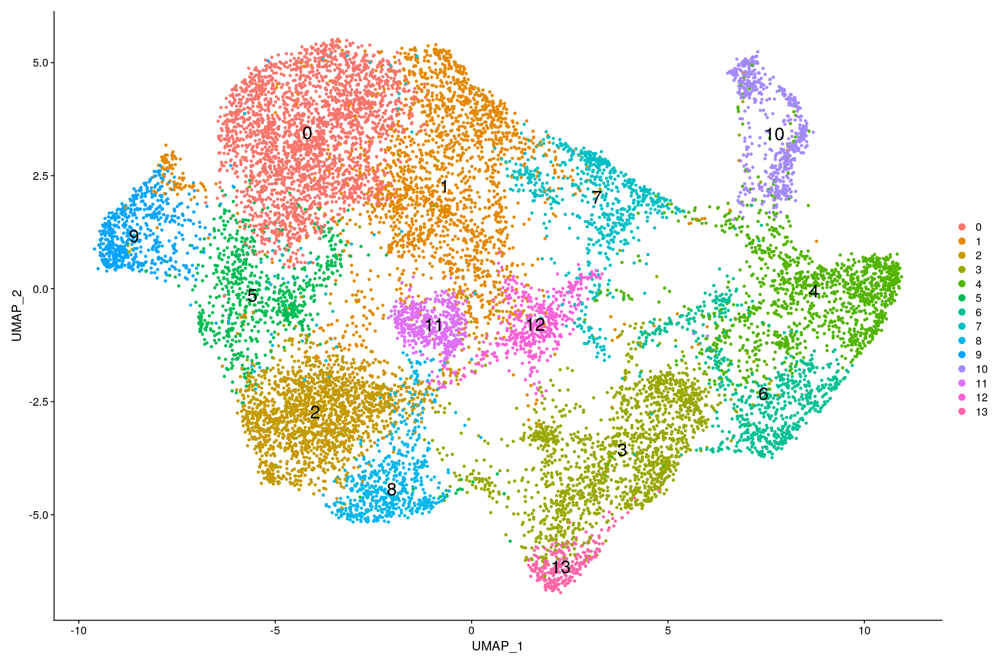

In [46]:
DimPlot(data, reduction = "umap", pt.size = 1, label = TRUE, label.size = 7)

### Cell Type Annotation

Crucial aspect of single-cell analysis is to understand what cell types we have in our dataset. First of all, lets see the difference between identified clusters in term of gene expression. To do so, we will use `FindAllMarkers` that perform differential expression analysis between each cluster. We will visualize top10 differentially expressed genes in each cluster to see what are they and are there any overlaps between clusters.

In [47]:
markers <- FindAllMarkers(data)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13



In [48]:
write.table(markers, file = "./markers.tsv", sep = "\t")

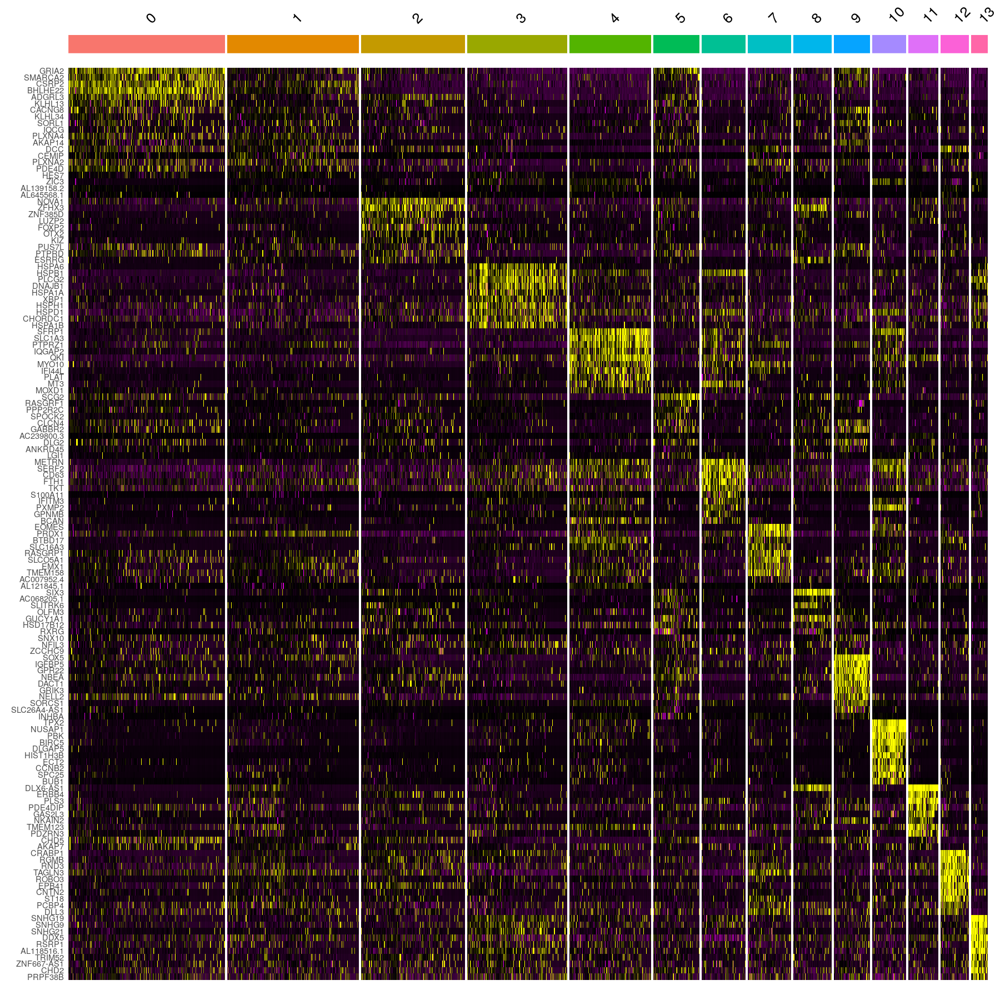

In [49]:
top10 <- markers %>%
    group_by(cluster) %>%
    top_n(n = 10, wt = avg_logFC)

options(repr.plot.width = 15, repr.plot.height = 15)
DoHeatmap(data, features = top10$gene) + NoLegend()

First of all, we can notice that clusters deviate in size. Secondly, we see that in each cluster we have a distinct set of genes that separate one cluster from others. Let's take a look in the localization of some of the genes from this list in our low-dimensional projection.

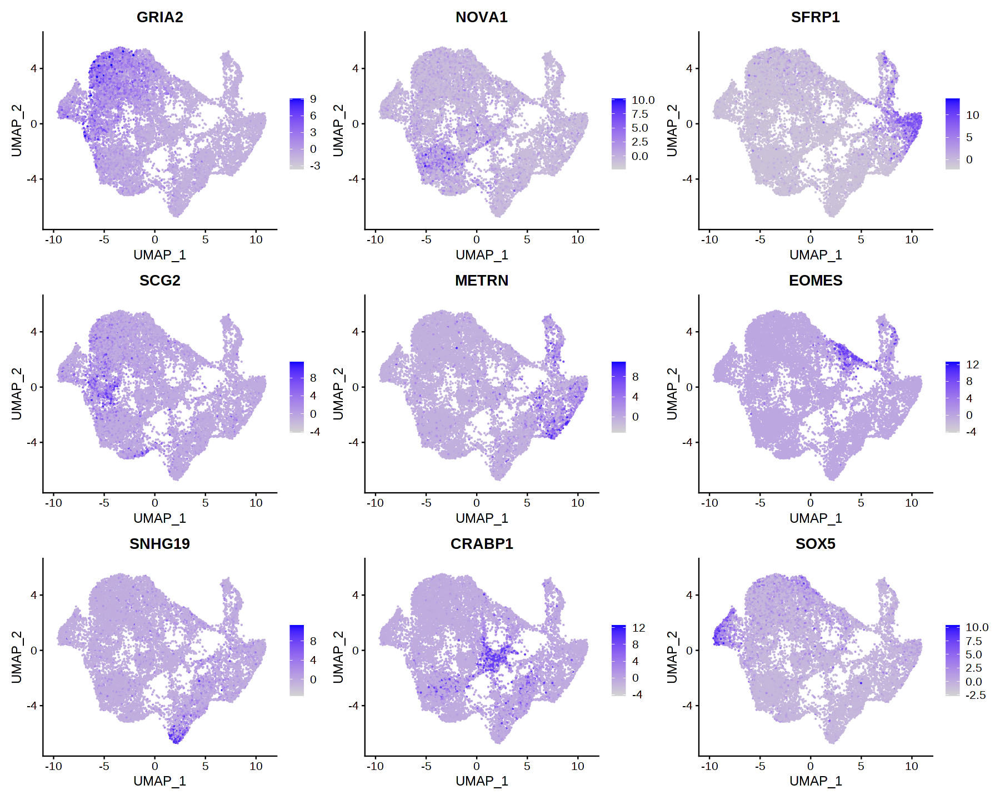

In [50]:
FeaturePlot(data.clusters_annotated, features = c("GRIA2", "NOVA1", "H3PA6", "SFRP1", "SCG2", "METRN", "EOMES",
                                                  "SNHG19", "CRABP1", "SOX5"))

The next logical step is to annotate present clusters. From the information we obtained after finding all markers in each cluster, we have a possibility to manually annotate them using well establish markers that can tell us what kind of cells we are having in our clusters. This is very time consuming operation which also requires a certain level of proficiency. Other methods use semi-automatic or fully automatic approach for cell type annotation. Various packages available for this tasks are summarized in this [GitHub repository](https://github.com/seandavi/awesome-single-cell) or we can find some extra on the [10X Genetics analysis guides](https://www.10xgenomics.com/resources/analysis-guides/web-resources-for-cell-type-annotation).

We will be using package `SingleR` together with `celldex` that will be the source of the reference. First, we will download reference for annotation. `Celldex` provides with various references which are mostly about different immune cells. It also contains quite comprehensive reference which is Human Cell Atlas. This one will be the choice for this project.

In [51]:
saveRDS(data, file = "./seurat_obj.rds")

In [52]:
data <- readRDS(file = "./seurat_obj.rds")

In [53]:
ref <- HumanPrimaryCellAtlasData()

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache



In [54]:
ref$label.fine

[1] "DC:monocyte-derived:immature"                          
  [2] "DC:monocyte-derived:immature"                          
  [3] "DC:monocyte-derived:immature"                          
  [4] "DC:monocyte-derived:Galectin-1"                        
  [5] "DC:monocyte-derived:Galectin-1"                        
  [6] "DC:monocyte-derived:Galectin-1"                        
  [7] "DC:monocyte-derived:LPS"                               
  [8] "DC:monocyte-derived:LPS"                               
  [9] "DC:monocyte-derived:LPS"                               
 [10] "DC:monocyte-derived"                                   
 [11] "DC:monocyte-derived"                                   
 [12] "DC:monocyte-derived"                                   
 [13] "Smooth_muscle_cells:bronchial:vit_D"                   
 [14] "Smooth_muscle_cells:bronchial:vit_D"                   
 [15] "Smooth_muscle_cells:bronchial:vit_D"                   
 [16] "Smooth_muscle_cells:bronchial"                         
 [17] "Smooth_muscle_cells:bronchial"                         
 [18] "Smooth_muscle_cells:bronchial"                         
 [19] "Epithelial_cells:bronchial"                            
 [20] "Epithelial_cells:bronchial"                            
 [21] "Epithelial_cells:bronchial"                            
 [22] "Epithelial_cells:bronchial"                            
 [23] "Epithelial_cells:bronchial"                            
 [24] "Epithelial_cells:bronchial"                            
 [25] "Epithelial_cells:bronchial"                            
 [26] "Epithelial_cells:bronchial"                            
 [27] "Epithelial_cells:bronchial"                            
 [28] "Epithelial_cells:bronchial"                            
 [29] "B_cell"                                                
 [30] "B_cell"                                                
 [31] "B_cell"                                                
 [32] "B_cell"                                                
 [33] "Neutrophil"                                            
 [34] "Neutrophil"                                            
 [35] "Neutrophil"                                            
 [36] "T_cell:CD8+_Central_memory"                            
 [37] "T_cell:CD8+_Central_memory"                            
 [38] "T_cell:CD8+_Central_memory"                            
 [39] "T_cell:CD8+"                                           
 [40] "T_cell:CD4+"                                           
 [41] "T_cell:CD8+"                                           
 [42] "T_cell:CD4+"                                           
 [43] "T_cell:CD8+"                                           
 [44] "T_cell:CD8+"                                           
 [45] "T_cell:CD8+"                                           
 [46] "T_cell:CD4+"                                           
 [47] "T_cell:CD8+"                                           
 [48] "T_cell:CD8+_effector_memory_RA"                        
 [49] "T_cell:CD8+_effector_memory_RA"                        
 [50] "T_cell:CD8+_effector_memory_RA"                        
 [51] "T_cell:CD8+_effector_memory_RA"                        
 [52] "T_cell:CD8+_effector_memory"                           
 [53] "T_cell:CD8+_effector_memory"                           
 [54] "T_cell:CD8+_effector_memory"                           
 [55] "T_cell:CD8+_effector_memory"                           
 [56] "T_cell:CD8+_naive"                                     
 [57] "T_cell:CD8+_naive"                                     
 [58] "T_cell:CD8+_naive"                                     
 [59] "T_cell:CD8+_naive"                                     
 [60] "Monocyte"                                              
 [61] "Monocyte"                                              
 [62] "Monocyte"                                              
 [63] "Monocyte"                                              
 [64] "Monocyte"                 

In the output above we can see all the cell types that our reference contains. Let's run `SingleR` function to make predictions about cell types. It's important to specify argument `clusters` so that SingleR will use all data for each cluster combine to make predictions. Otherwise, it would predict cell type for individual cells and the results would be quite messy.

In [55]:
predictions_clustered <- SingleR(test = as.SingleCellExperiment(data), ref = ref, 
                                 clusters = Idents(data), labels = ref$label.fine)

In [56]:
predictions_clustered$labels

[1] "Neurons:adrenal_medulla_cell_line"                  
 [2] "DC:monocyte-derived:AM580"                          
 [3] "Neurons:adrenal_medulla_cell_line"                  
 [4] "Monocyte:F._tularensis_novicida"                    
 [5] "iPS_cells:CRL2097_foreskin-derived:d20_hepatic_diff"
 [6] "Neurons:adrenal_medulla_cell_line"                  
 [7] "Tissue_stem_cells:iliac_MSC"                        
 [8] "Tissue_stem_cells:BM_MSC:TGFb3"                     
 [9] "Platelets"                                          
[10] "Neutrophil:uropathogenic_E._coli_UTI89"             
[11] "Endothelial_cells:HUVEC:PR8-infected"               
[12] "Gametocytes:spermatocyte"                           
[13] "B_cell"                                             
[14] "Monocyte:F._tularensis_novicida"

Now we will trim labels.

In [57]:
labels <- sub("\\:.*", "", predictions_clustered$labels)

In [58]:
labels

[1] "Neurons"           "DC"                "Neurons"          
 [4] "Monocyte"          "iPS_cells"         "Neurons"          
 [7] "Tissue_stem_cells" "Tissue_stem_cells" "Platelets"        
[10] "Neutrophil"        "Endothelial_cells" "Gametocytes"      
[13] "B_cell"            "Monocyte"

Alright, we obtained the following cell types for the clusters: neurons for clusters 0, 2, 5; dendritic cells for cluster 1; monocyte for clusters 3 and 13; different stem cells for clusters 4, 6, 7; blood and blood vessel cells for clusters 8, 9, 10; B cells for cluster 12. Overall, we have 10 different cell types in our samples. Though this particular reference is not ideal, we have identified cell types that we would expect to find in the organoids: neurons, stem cells, and cell of supporting systems like immune and cardiovascular system.

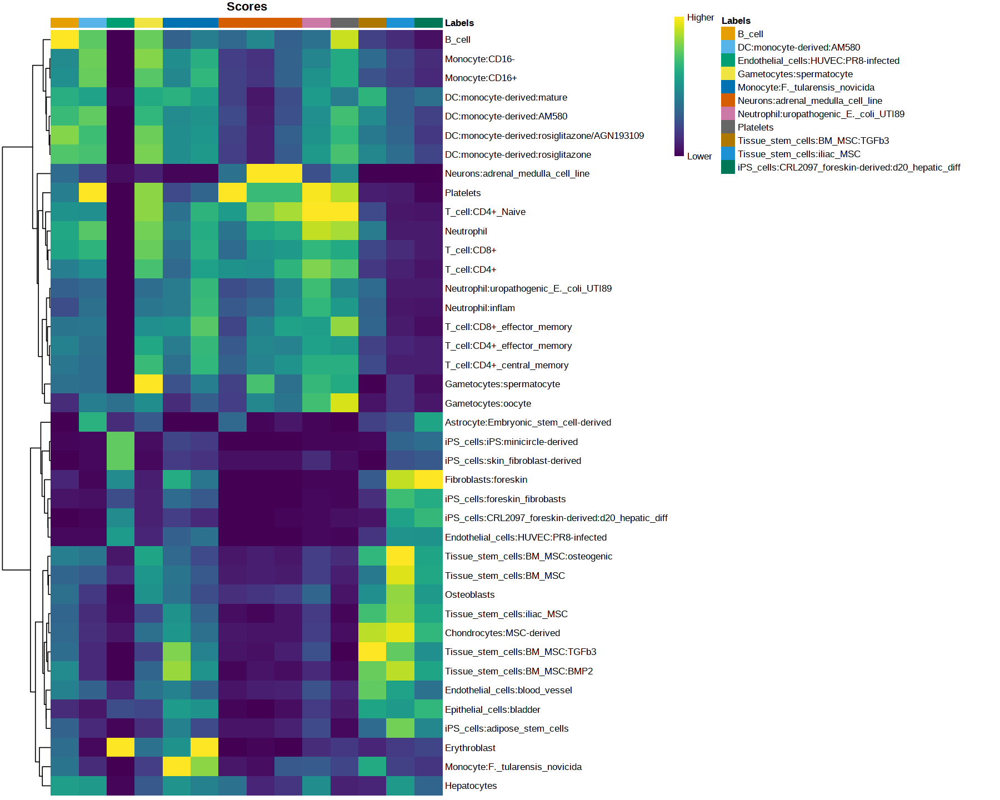

In [59]:
options(repr.plot.width = 15, repr.plot.height = 12)
predictions_plot <- plotScoreHeatmap(predictions_clustered)

Let's rename the cell identities according to the cell types we defined above and visualize them using UMAP.

In [60]:
data.clusters_annotated <- data

new_idens <- labels
names(new_idens) <- levels(data.clusters_annotated)

data.clusters_annotated <- RenameIdents(data.clusters_annotated, new_idens)

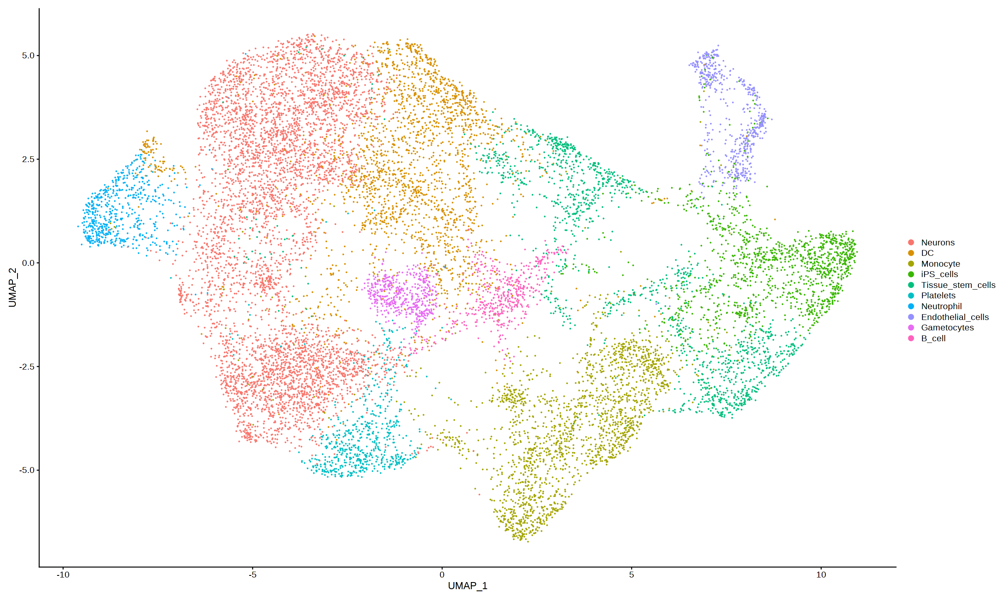

In [61]:
DimPlot(data.clusters_annotated, reduction = "umap")

As we can see above, three clusters that were annotated as neurons are clustering together, which can suggest that the annotation is correct, but we might be dealing with different types of neurons. We can apply same logic to tissue stem cells, as they are spread on the UMAP.

In [62]:
saveRDS(data.clusters_annotated, file = "./seurat_obj_annotated.rds")

Regarding the neurons, authors of the reference paper have been using different approach for that and they manage to identify different neuron's populations in this samples. Indeed, if we use dedicated annotation we might obtain more sophisticated results. One of the options is to use the dataset from the [Nowakowski et al. (2017) paper](https://www.science.org/doi/10.1126/science.aap8809?url_ver=Z39.88-2003&rfr_id=ori%3Arid%3Acrossref.org&rfr_dat=cr_pub++0pubmed&). We can find this dataset in the package `scRNAseq`, which is a collection of various single-cell dataset containing different reference data for different human or mouse tissues. Unfortunately, dataset from the paper comes with single matrix containing TMPs, which we were not able to use.

In [63]:
# system("wget https://bioconductor.org/packages/release/data/experiment/src/contrib/scRNAseq_2.8.0.tar.gz")

# install.packages("./scRNAseq_2.8.0.tar.gz", repos = NULL, type = "source")
# library(scRNAseq)

# sce <- NowakowskiCortexData()
# sce

### Differential Expression

Let's us start differential expression analysis. For that, we will use three datasets where organoids from 13234 cell line. First sample, as mentioned previously, has been treated with vitamin A, second sample hasn't been treated, and the third one was treated with DEAB. Additionally, we will subset from this three dataset only neurons since we are expecting that different treatment will affect this particular cells and we will observ differential expression between them.

In [64]:
data.clusters_annotated <- readRDS(file = "./seurat_obj_annotated.rds")

In [65]:
de_data <- subset(data.clusters_annotated, subset = orig.ident == c("deab", "vitA", "noVitA"))
neurons <- subset(de_data, idents = "Neurons")

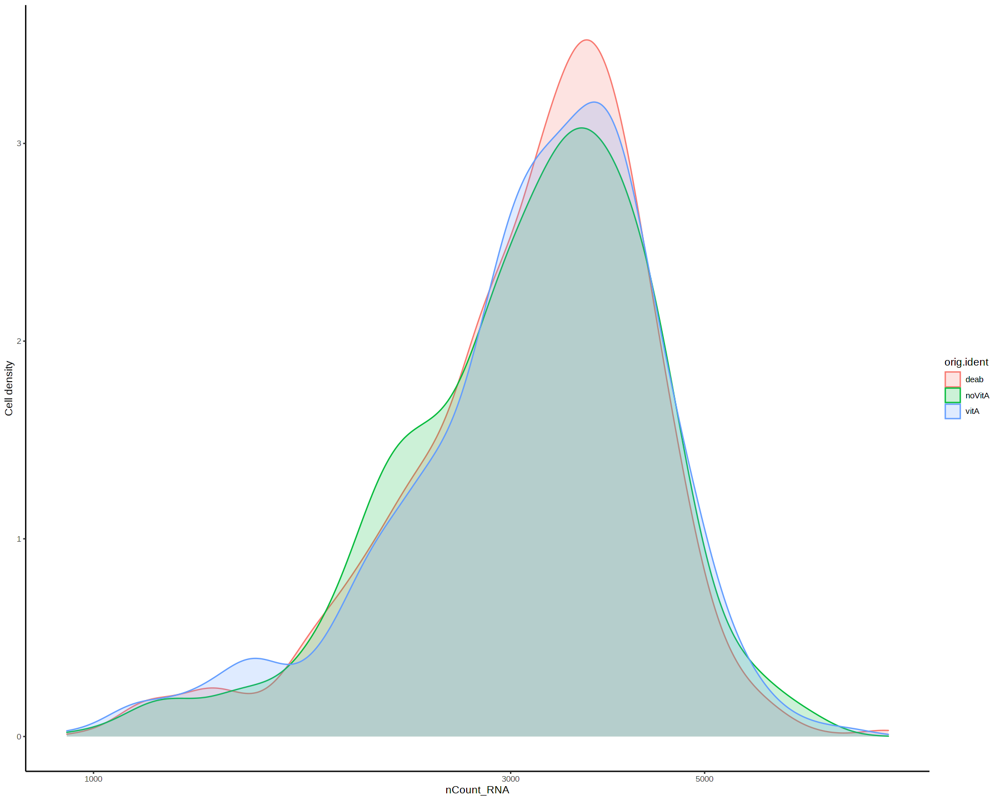

In [66]:
de_data@meta.data %>% 
    ggplot(aes(color = orig.ident, x = nCount_RNA, fill = orig.ident)) + geom_density(alpha = 0.2) + 
    scale_x_log10() + theme_classic() + ylab("Cell density")

First thing first, we would like to compare the samples between each other. Cell densities are close to be identical.

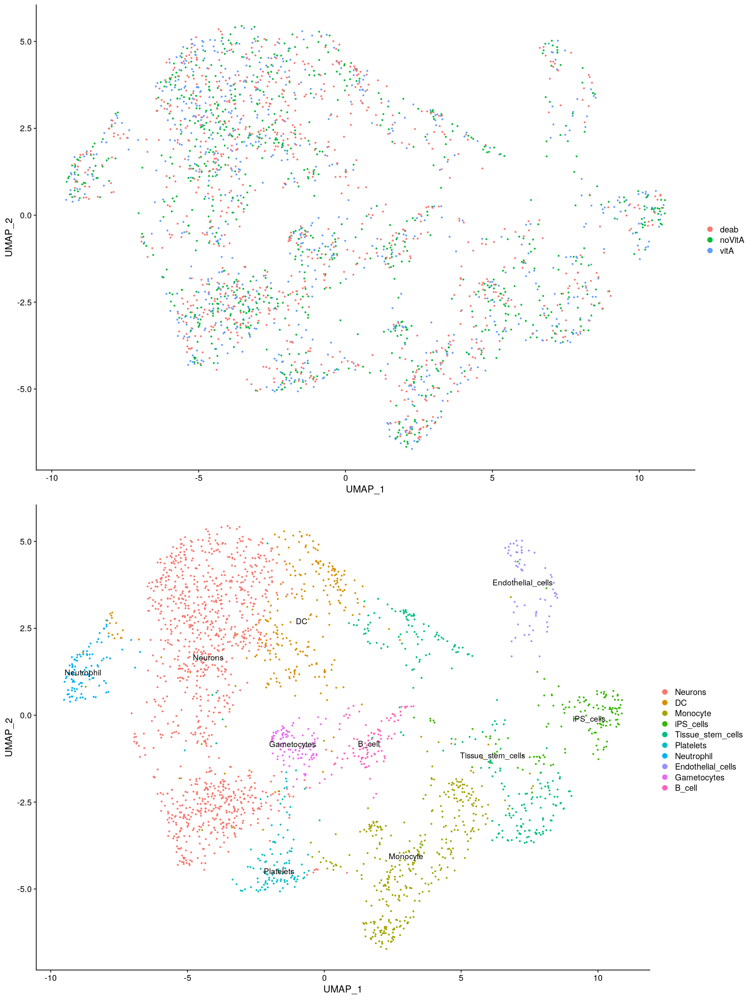

In [67]:
options(repr.plot.width = 15, repr.plot.height = 20)

plot_1 <- DimPlot(de_data, reduction = "umap", group.by = "orig.ident")
plot_2 <- DimPlot(de_data, reduction = "umap", label = TRUE)

grid.arrange(plot_1, plot_2, nrow = 2)

First UMAP is used to see how cells within three samples overlaps. They seem to be homogenous in this regard. Second UMAP serves as comparison between this subset and the integrated dataset. There is slight differences between them — obviously, we would have less dense umap, but we can see that clusters are separated more distinctively, though overall structures are preserved.

Below is the sample to sample comparison of all clusters and only neurons. Overall, they are vary similar to each other, however we can see that the spatial positions are slightly different for small amount of cells.

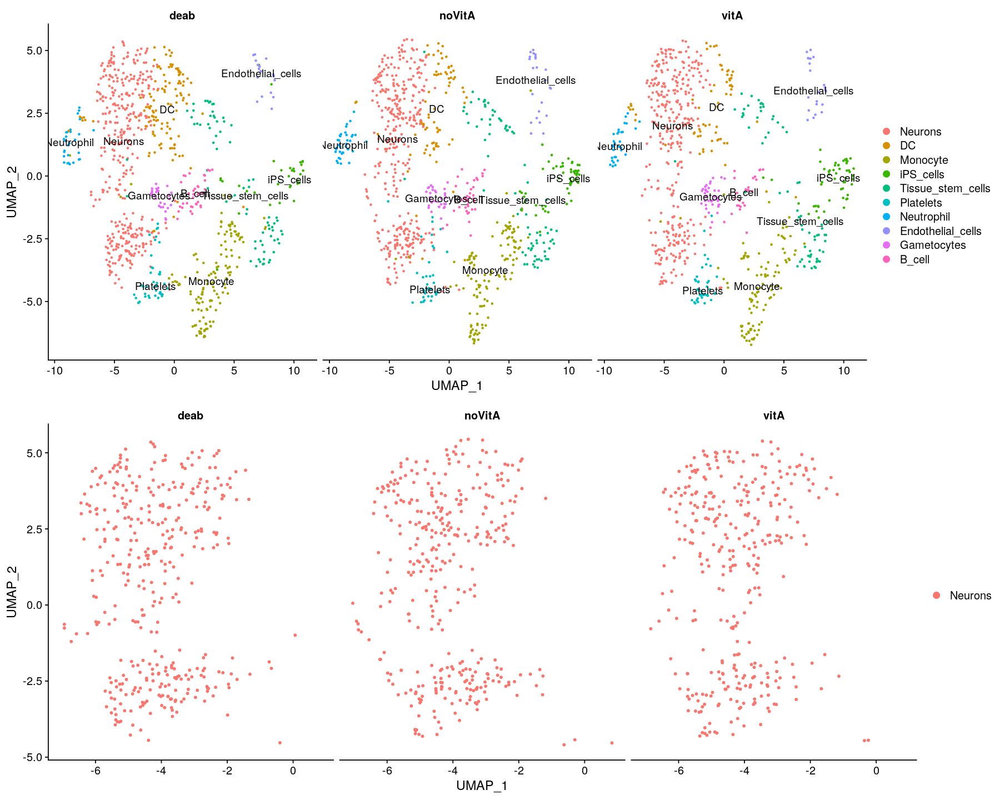

In [68]:
options(repr.plot.width = 15, repr.plot.height = 12)

plot_1 <- DimPlot(de_data, reduction = "umap", split.by = "orig.ident", label = TRUE)
plot_2 <- DimPlot(neurons, reduction = "umap", split.by = "orig.ident")

grid.arrange(plot_1, plot_2, nrow = 2)

In [69]:
de_data$celltype.resp <- paste(Idents(de_data), de_data$orig.ident, sep = "_")
de_data$celltype <- Idents(de_data)
Idents(de_data) <- "celltype.resp"

In [70]:
response <- FindMarkers(de_data, ident.1 = "Neurons_vitA", ident.2 = "Neurons_noVitA")

In [71]:
top_n(response, -100, p_val)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ACACB,5.447276e-17,2.8880862,0.202,0.271,1.634183e-13
MAN1B1-DT,8.011472e-14,2.9359987,0.173,0.388,2.403441e-10
C22orf46,6.123668e-13,-2.7926038,0.147,0.237,1.837101e-09
LRRC39,5.059082e-12,4.4855693,0.240,0.466,1.517725e-08
CU634019.6,1.948959e-11,-0.5291968,0.261,0.346,5.846878e-08
KIAA1324,3.158787e-11,1.6660198,0.182,0.307,9.476360e-08
EPB41L2,4.270408e-11,0.5341167,0.179,0.285,1.281122e-07
DNAH5,6.969808e-11,3.1005435,0.214,0.218,2.090942e-07
SORCS3,1.030060e-10,3.0387151,0.326,0.508,3.090181e-07


We identified differentially expressed genes in the subset for samples that have been stimulation with vitamin A and without stimulation. For that we used Seurat's function `FindMarkers`. Above is the top-100 genes according to the adjusted p-value.

Below, we are visualizing expression of genes KIF13B, MBNL3 and FAM167A between three different conditions using violin plots. As we can see, all three genes are barely expressed in the samples treated with DEAB. These genes have different cellular function and brief description of the gene function doesn't reveal why DEAB compound suppresses the activity of these genes. Important to notice, though violin plot shows little to no expression of MBNL3 gene, below on the `FeaturePlot` we can see that this gene is being express more actively in the sample stimulated by DEAB.

In [72]:
de_data <- subset(data.clusters_annotated, subset = orig.ident == c("deab", "vitA", "noVitA"))

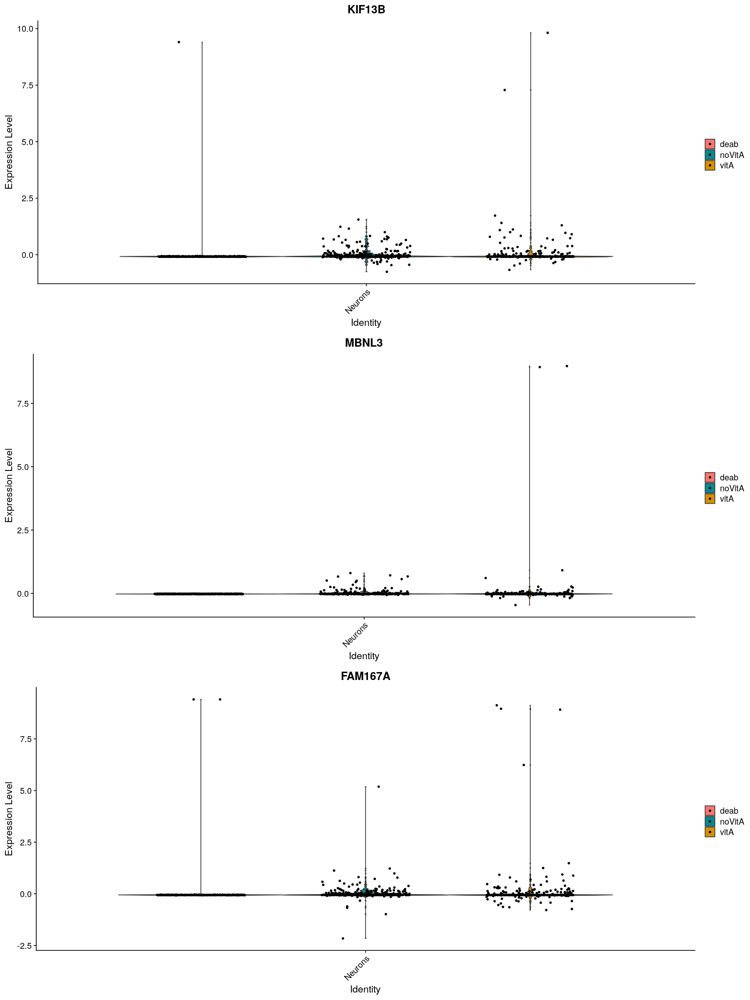

In [73]:
options(repr.plot.width = 15, repr.plot.height = 20)

plot_1 <- VlnPlot(de_data, features = "KIF13B", split.by = "orig.ident", ident = "Neurons")
plot_2 <- VlnPlot(de_data, features = "MBNL3", split.by = "orig.ident", ident = "Neurons")
plot_3 <- VlnPlot(de_data, features = "FAM167A", split.by = "orig.ident", ident = "Neurons")

grid.arrange(plot_1, plot_2, plot_3, nrow = 3)

Below we are switching to different assay in Seurat object to compare differences in gene expression between neurons from different samples. For that we are going to subset data for each condition. Later, we will calculate logarithmic average expression across different conditions.

In [74]:
DefaultAssay(de_data) <- "RNA"

In [75]:
neurons_stim <- subset(de_data, idents = "Neurons", subset = orig.ident == "vitA")
neurons_ctrl <- subset(de_data, idents = "Neurons", subset = orig.ident == "noVitA")
neurons_deab <- subset(de_data, idents = "Neurons", subset = orig.ident == "deab")

Idents(neurons_stim) <- "stim"
Idents(neurons_ctrl) <- "ctrl"
Idents(neurons_deab) <- "deab"

In [76]:
avg.neurons.stim <- as.data.frame(log1p(AverageExpression(neurons_stim)$RNA))
avg.neurons.stim$genes <- rownames(avg.neurons.stim)

avg.neurons.ctrl <- as.data.frame(log1p(AverageExpression(neurons_ctrl)$RNA))
avg.neurons.ctrl$genes <- rownames(avg.neurons.ctrl)

avg.neurons.deab <- as.data.frame(log1p(AverageExpression(neurons_deab)$RNA))
avg.neurons.deab$genes <- rownames(avg.neurons.deab)

combined <- merge(avg.neurons.stim, c(avg.neurons.ctrl, avg.neurons.deab))

Finished averaging RNA for cluster stim

Finished averaging SCT for cluster stim

Finished averaging integrated for cluster stim

Finished averaging RNA for cluster ctrl

Finished averaging SCT for cluster ctrl

Finished averaging integrated for cluster ctrl

Finished averaging RNA for cluster deab

Finished averaging SCT for cluster deab

Finished averaging integrated for cluster deab



Below is the scatter plot for three pairs of data. Each pair is the comparison between stimulated sample and control, stimulated with DEAB and stimulated with vitamin A, and control against stimulated with DEAB. As we can see, there are not many outliers and overall, we can observ the linear trend indicating little differential expression

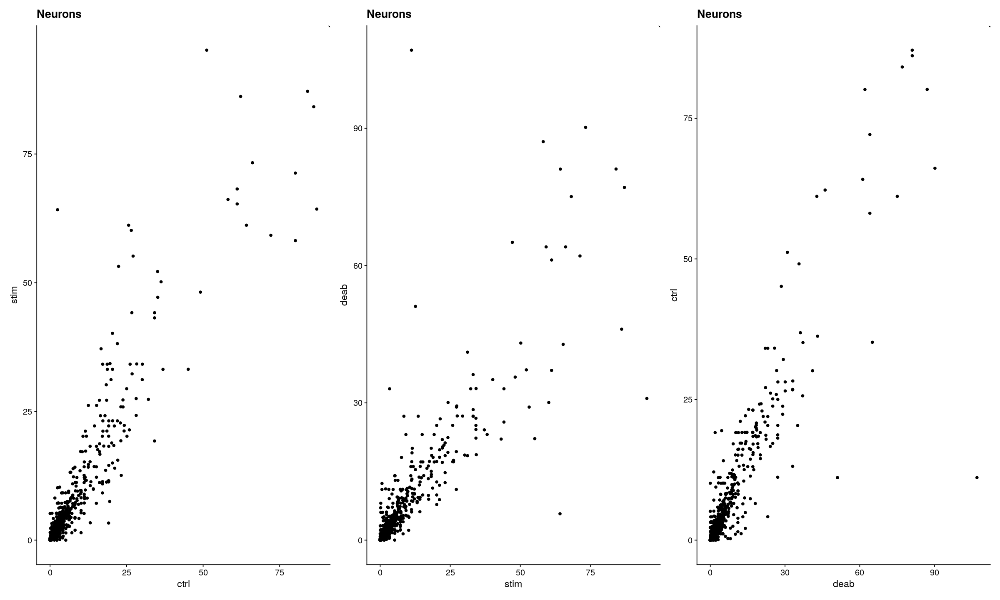

In [77]:
theme_set(theme_cowplot())

ggplot(combined, aes(ctrl, stim)) + geom_point() + ggtitle("Neurons") + 
ggplot(combined, aes(stim, deab)) + geom_point() + ggtitle("Neurons") +
ggplot(combined, aes(deab, ctrl)) + geom_point() + ggtitle("Neurons")

However, there are some genes that behave differently depending on the condition. Below we plotted 4 of them for every condition. As we can see, FAM167 is being more actively expressed in the control (no vitamin A), while there is almost no expression in sample stimulated with DEAB, and relatively little expression in dataset stimulated with vitamin A. Also we can observ that some genes are being more actively expressed in particular area of the cell "clouds", indicating that there are indeed different types of neurons that react differently to the treatment.

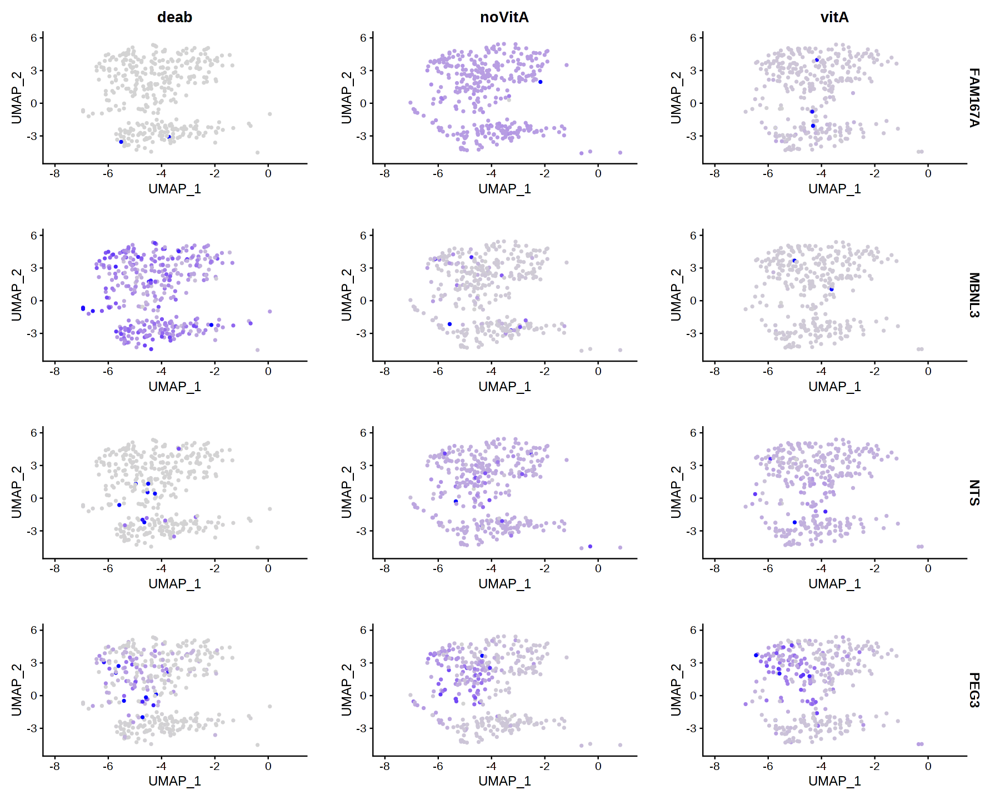

In [78]:
FeaturePlot(neurons, features = c("FAM167A", "MBNL3", "NTS", "PEG3"), split.by = "orig.ident")

#### Pseudobalk Differential Analysis

We are also interested in looking into differential expression between samples treated with vitamin A and treated with DEAB in pseudobalk manner. We can use [the ZINB-WaVE model](https://bioconductor.org/packages/release/bioc/vignettes/zinbwave/inst/doc/intro.html), which is appropriate for analyzing zero-inflated count data such as single-cell datasets, but for simplicity we will run standard DESeq2 experiment, where we will introduce pseudocounts. For actual differential expression we are going to use arguments specified in DESeq [vignette](https://bioconductor.org/packages/devel/bioc/vignettes/DESeq2/inst/doc/DESeq2.html#recommendations-for-single-cell-analysis) for single-cell data.

We will start with making a subset with cells from `vitA` and `deab` samples. Then we convert them to the object of SingleCellExperiment followed by DESeq function for differential expression. After that, we will visualize results with some standard plots like MA plot, heatmap, etc.

In [79]:
data.clusters_annotated <- readRDS(file = "./seurat_obj_annotated.rds")

de_data <- subset(data.clusters_annotated, subset = orig.ident == c("vitA", "deab"))

In [80]:
counts <- de_data@assays$RNA@counts
metadata <- de_data@meta.data
metadata$cluster_id <- factor(de_data@active.ident)

sce <- SingleCellExperiment(assays = list(counts = counts), colData = metadata)
table(sce$cluster_id, sce$orig.ident)

clusters <- levels(metadata$cluster_id)

                   
                    deab vitA
  Neurons            529  530
  DC                 168  115
  Monocyte           206  159
  iPS_cells           84   53
  Tissue_stem_cells  109  101
  Platelets           61   56
  Neutrophil          42   55
  Endothelial_cells   27   24
  Gametocytes         44   56
  B_cell              54   40

In [81]:
get_dds_LRTresults <- function(x) {
    
    cluster_metadata <- metadata[which(metadata$cluster_id == x), ]
    idx <- c(rownames(cluster_metadata))
    counts <- counts[, idx] + 1 # Pseudocounts otherwise won't run
    cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])
    colnames(cluster_counts) <- gsub("\\.", "-", colnames(cluster_counts))
    
    dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ orig.ident)

    # Arguments according to DESeq2 recommendations for single-cell data
    dds <- DESeq(dds, test = "LRT", useT = TRUE, minmu = 1e-6, minReplicatesForReplace = Inf, reduced = ~ 1)
    res <- results(dds)
    
    summary(res)
    res
    plotDispEsts(dds)
    
    sum(res$padj < 0.1, na.rm = TRUE)
    
    # Up and Down regulated genes
    row.names(res)[which(res$log2FoldChange != NA && res$log2FoldChange > 1 && res$padj < 0.05)]
    row.names(res)[which(res$log2FoldChange != NA && res$log2FoldChange < -1 && res$padj < 0.05)] 
    
    return(dds)
}

converting counts to integer mode

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.

final dispersion estimates

fitting model and testing




out of 24647 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)       : 0, 0%
LFC < 0 (down)     : 0, 0%
outliers [1]       : 3, 0.012%
low counts [2]     : 0, 0%
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



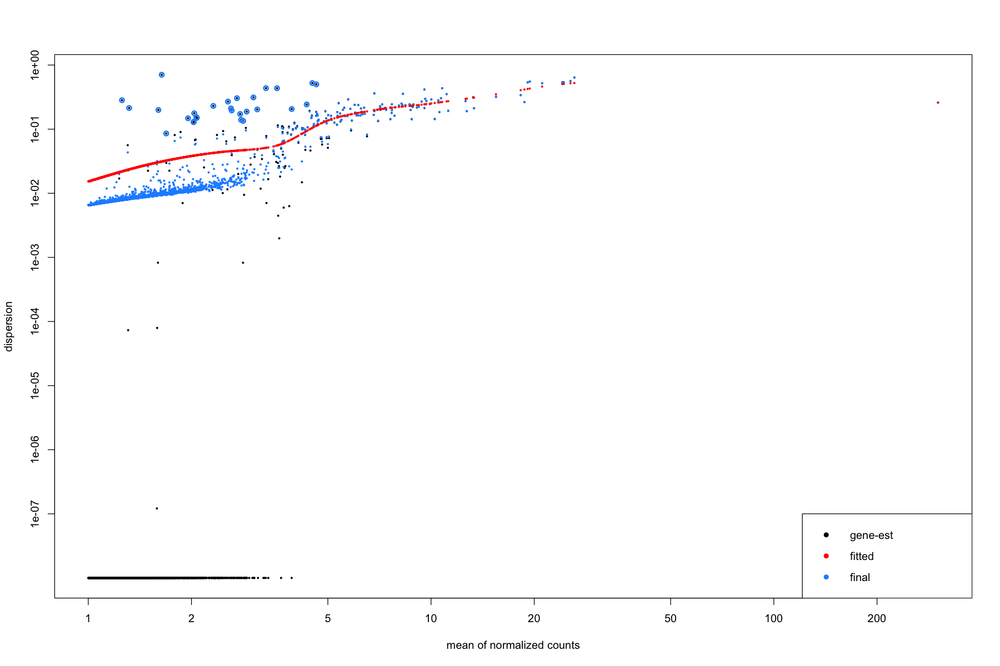

In [82]:
neurons_de <- get_dds_LRTresults(clusters[1])

In [83]:
res_neurons <- results(neurons_de)
head(res_neurons)

log2 fold change (MLE): orig.ident vitA vs deab 
LRT p-value: '~ orig.ident' vs '~ 1' 
DataFrame with 6 rows and 6 columns
            baseMean log2FoldChange     lfcSE        stat    pvalue      padj
           <numeric>      <numeric> <numeric>   <numeric> <numeric> <numeric>
AL627309.1   1.00345    -0.00269309 0.0889122 0.000917444  0.975836  0.999991
AL669831.5   1.03753    -0.00269308 0.0874581 0.000948203  0.975435  0.999991
LINC00115    1.01292    -0.00808639 0.0885011 0.008348588  0.927198  0.999991
FAM41C       1.00629     0.00545008 0.0887886 0.003767845  0.951054  0.999991
AL645608.7   1.00534     0.00274082 0.0888297 0.000952016  0.975385  0.999991
AL645608.3   1.02522    -0.01601453 0.0879762 0.033136217  0.855556  0.999991

In [84]:
cat("Up-regulated Genes:")
row.names(res_neurons)[which(!is.na(res_neurons$log2FoldChange) & 
                             res_neurons$log2FoldChange > 1.0 & res_neurons$padj < 0.05)] 
cat("Down-regulated Genes:")
row.names(res_neurons)[which(!is.na(res_neurons$log2FoldChange) &
                             res_neurons$log2FoldChange < -1.0 & res_neurons$pvalue < 0.05)]

Up-regulated Genes:

character(0)

Down-regulated Genes:

character(0)

Unfortunately, we can see that there is no differential expression between samples. The MA plot and heatmap also reports the same results.

In [85]:
ntd_neurons <- normTransform(neurons_de)
vsd_neurons <- varianceStabilizingTransformation(neurons_de)

-- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit was automatically substituted.
   specify fitType='local' or 'mean' to avoid this message next time.



In [86]:
ntd <- meanSdPlot(assay(ntd_neurons), plot = FALSE)
vsd <- meanSdPlot(assay(vsd_neurons), plot = FALSE)

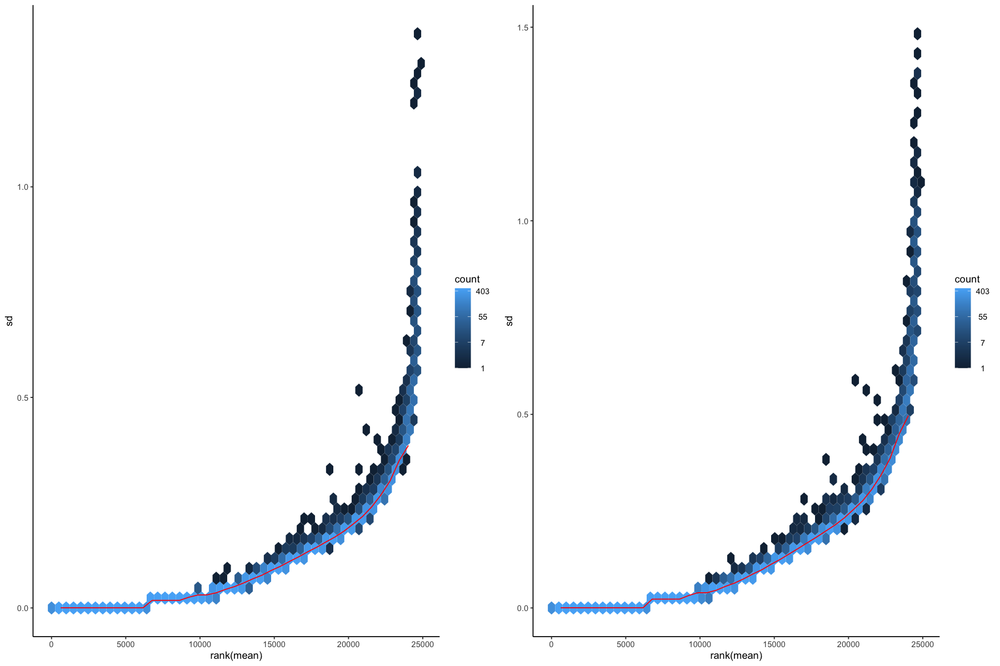

In [87]:
options(repr.plot.width = 15, repr.plot.height = 10)
grid.arrange(ntd$gg + theme_classic(), vsd$gg + theme_classic(), ncol = 2)

In [88]:
library(stringr)


Attaching package: ‘stringr’


The following object is masked from ‘package:graph’:

    boundary




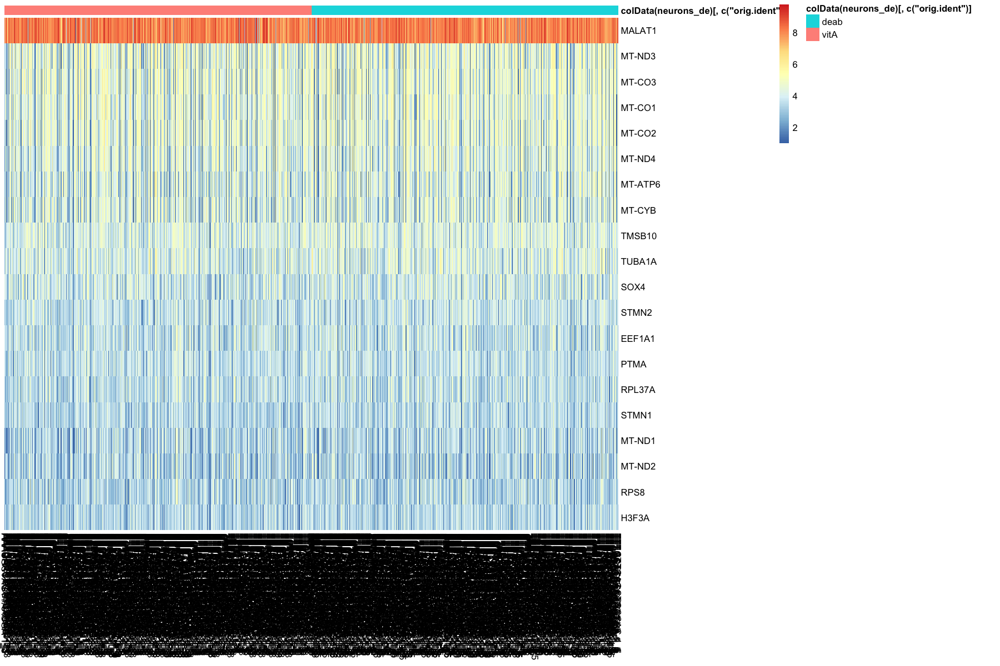

In [89]:
select_1 <- order(rowMeans(counts(neurons_de, normalized = TRUE)), decreasing = TRUE)[1:20]
df_1 <- as.data.frame(colData(neurons_de)[, c("orig.ident")])
row.names(df_1) <- colnames(ntd_neurons)

pheatmap(assay(ntd_neurons)[select_1, ], cluster_rows = FALSE, show_rownames = TRUE,
         cluster_cols = FALSE, annotation_col = df_1)

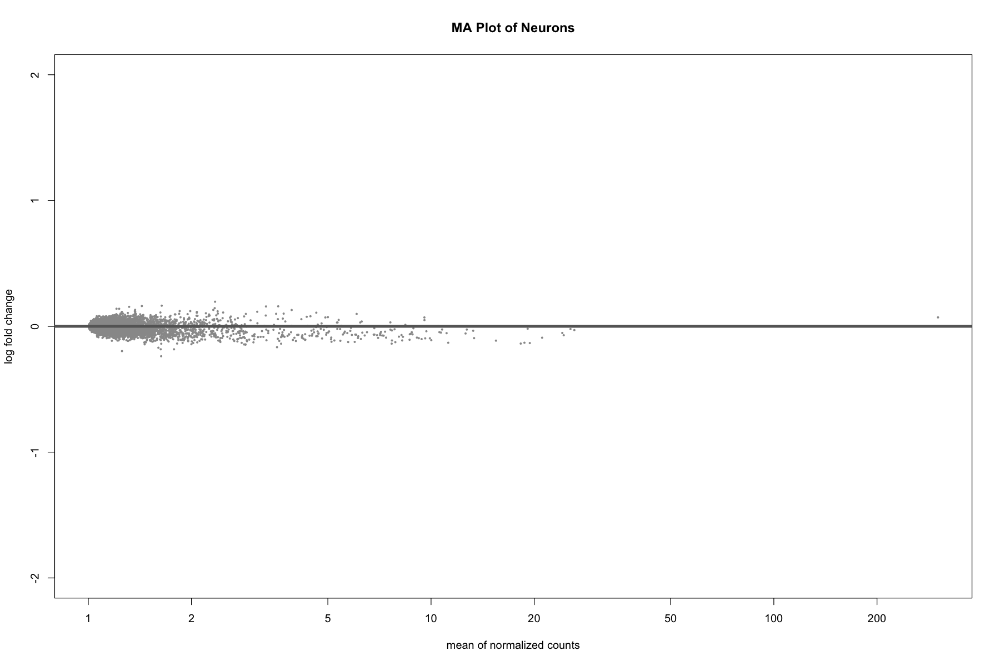

In [90]:
plotMA(res_neurons, ylim = c(-2,2), main = "MA Plot of Neurons")

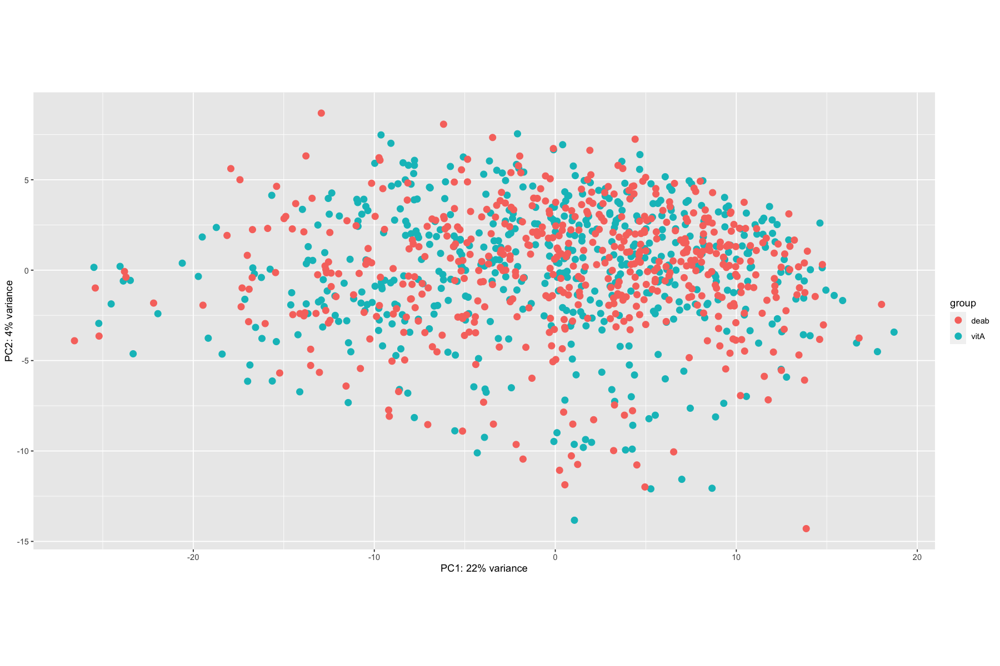

In [91]:
plotPCA(vsd_neurons, intgroup=c("orig.ident"))

### Functional Analysis

For functional analysis we are going to use library [topGO](https://bioconductor.org/packages/release/bioc/vignettes/topGO/inst/doc/topGO.pdf). First, we need to prepare `topGOdata` object, which contains all the information necessary for the downstream analysis. We need to proved the gene universe, GO annotations, and a score associated with each differentially expressed gene. The information about GO terms is stored in the object from library `ALL`.

We wrote a set of function for this purposes. First, we are obtaining the differentially expressed genes from the cell type of our preference between conditions. Once again, we will be sticking to neurons. We can choose to test between specific conditions or between condition and the rest of the cells. Then we are getting p-values of previously selected genes that are going to be used in the following steps which is either creating GO object or as input for the `clusterProfiler`.

In [92]:
get_diff_genes <- function(data, cell_type, control, against = NULL) {
    de_data <- subset(data, idents = cell_type)
    de_data$celltype.resp <- paste(Idents(de_data), de_data$orig.ident, sep = "_")
    de_data$celltype <- Idents(de_data)
    Idents(de_data) <- "celltype.resp"
    
    if (against != FALSE) {
        response <- FindMarkers(de_data, ident.1 = control, ident.2 = against)
    } else {
        response <- FindMarkers(de_data, ident.1 = control)
    }
} 

In [93]:
get_p_values <- function(diff_genes) {
    genes <- rownames(diff_genes)
    p_values <- diff_genes$p_val_adj
    names(p_values) <- genes
    
    p_values[p_values == 0] <- NA
    p_values <- p_values[complete.cases(p_values)]
    
    return (p_values)
} 

In [94]:
get_go <- function(p_values) {
    allGO2genes <- annFUN.org(whichOnto = "BP", feasibleGenes = NULL, mapping = "org.Hs.eg.db", ID = "symbol")
    go_data <- new("topGOdata", ontology = "BP", allGenes = p_values, annot = annFUN.GO2genes, GO2genes = allGO2genes,
                   geneSel = function(allScore) { return(allScore < 0.05) }, nodeSize = 10)
}

After creating `go_data` object, we are able to proceed with the enrichment analysis. For that, `topGO` provides us with the function `runTest()` with different test statistics: Fisher's exact test, and a Kolmogorov-Smirnov like test. The difference is that first is based on gene counts, while second option is based on gene scores. We are going to use both this statistics, and for Kolmogorov-Smirnov test we will also apply different algorithm.

In [95]:
get_table <- function(go_object, score = FALSE, nodes = 10) {
    resultFisher <- runTest(go_object, algorithm = "classic", statistic = "fisher")
    resultKS <- runTest(go_object, algorithm = "classic", statistic = "ks")
    resultKS.elim <- runTest(go_object, algorithm = "elim", statistic = "ks")
    
    results <- GenTable(go_object, classicFisher = resultFisher, 
                        classicKS = resultKS, elimKS = resultKS.elim, orderBy = "elimKS", 
                        ranksOf = "classicFisher", topNodes = nodes)
    
    if (score == TRUE) {
        return (score(resultKS.elim))
    } else {
        return (results)
    }
}

In [96]:
all_together <- function(data, cell_type, control, against, return_p, tiff = FALSE, file_name = "") {
    de_genes <- get_diff_genes(data, cell_type, control, against = against)
    p_values <- get_p_values(de_genes)
    
    if (return_p == TRUE) {
        return (p_values)
    } else {
        go_data <- get_go(p_values)
        go_results <- get_table(go_data)
        
        if (tiff == TRUE) {
            score <- get_table(go_data, score = TRUE)
            tiff(file_name, width = 6, height = 6, units = 'in', res = 500)
            showSigOfNodes(go_data, score, firstSigNodes = 5, useInfo = 'all')
            dev.off()
        }
        
        return (list("go_object" = go_data, "table" = go_results))
    }
}

In [97]:
# INPUT EXAMPLE: list_with_vector_p_values <- list(responce_1, responce_2)
# INPUT EXAMPLE: c("name_responce_1", "name_responce_2")

get_aggregated_plots <- function(list_with_vector_p_values, vector_of_names, title, showCategory = 10) {
    list_gene_ids <- lapply(list_with_vector_p_values, function(x) {
            bitr(names(x[x < 0.05]), fromType = "SYMBOL", toType = "ENTREZID", OrgDb = "org.Hs.eg.db")$ENTREZID
        }
    )
    names(list_gene_ids) <- vector_of_names

    ck <- compareCluster(geneCluster = list_gene_ids, fun = enrichKEGG)
    ck <- setReadable(ck, OrgDb = org.Hs.eg.db, keyType = "ENTREZID")
    
    return (plot <- dotplot(ck, showCategory = showCategory, title = title))
}

Below we are calling function that combines all previous ones to provide us with the necessary objects. First, we will visualize results of running `topGO` pipeline as a GO term graph. More detailed information can be obtained from the table of results.

In [98]:
go_results <- all_together(data.clusters_annotated, "Neurons", "Neurons_vitA", against = "Neurons_noVitA", 
                           return_p = FALSE)


Building most specific GOs .....

	( 4964 GO terms found. )


Build GO DAG topology ..........

	( 8936 GO terms and 20097 relations. )


Annotating nodes ...............

	( 1485 genes annotated to the GO terms. )


			 -- Classic Algorithm -- 

		 the algorithm is scoring 2003 nontrivial nodes
		 parameters: 
			 test statistic: fisher


			 -- Classic Algorithm -- 

		 the algorithm is scoring 2016 nontrivial nodes
		 parameters: 
			 test statistic: ks
			 score order: increasing


			 -- Elim Algorithm -- 

		 the algorithm is scoring 2016 nontrivial nodes
		 parameters: 
			 test statistic: ks
			 cutOff: 0.01
			 score order: increasing


	 Level 16:	4 nodes to be scored	(0 eliminated genes)


	 Level 15:	7 nodes to be scored	(0 eliminated genes)


	 Level 14:	10 nodes to be scored	(0 eliminated genes)


	 Level 13:	25 nodes to be scored	(0 eliminated genes)


	 Level 12:	49 nodes to be scored	(0 eliminated genes)


	 Level 11:	74 nodes to be scored	(0 eliminated genes)


	 Lev

In [99]:
options(repr.plot.width = 12, repr.plot.height = 10)
scores <- get_table(go_results$go_object, score = TRUE)


			 -- Classic Algorithm -- 

		 the algorithm is scoring 2003 nontrivial nodes
		 parameters: 
			 test statistic: fisher


			 -- Classic Algorithm -- 

		 the algorithm is scoring 2016 nontrivial nodes
		 parameters: 
			 test statistic: ks
			 score order: increasing


			 -- Elim Algorithm -- 

		 the algorithm is scoring 2016 nontrivial nodes
		 parameters: 
			 test statistic: ks
			 cutOff: 0.01
			 score order: increasing


	 Level 16:	4 nodes to be scored	(0 eliminated genes)


	 Level 15:	7 nodes to be scored	(0 eliminated genes)


	 Level 14:	10 nodes to be scored	(0 eliminated genes)


	 Level 13:	25 nodes to be scored	(0 eliminated genes)


	 Level 12:	49 nodes to be scored	(0 eliminated genes)


	 Level 11:	74 nodes to be scored	(0 eliminated genes)


	 Level 10:	141 nodes to be scored	(0 eliminated genes)


	 Level 9:	222 nodes to be scored	(0 eliminated genes)


	 Level 8:	275 nodes to be scored	(0 eliminated genes)


	 Level 7:	360 nodes to be scored	(36 eliminated g

Next, we are going to build the GO graph which represents go terms found. The subgraph induced by the 5 most significant GO terms identified by the `elim` algorithm

$dag
A graphNEL graph with directed edges
Number of Nodes = 43 
Number of Edges = 66 

$complete.dag
[1] "A graph with 43 nodes."


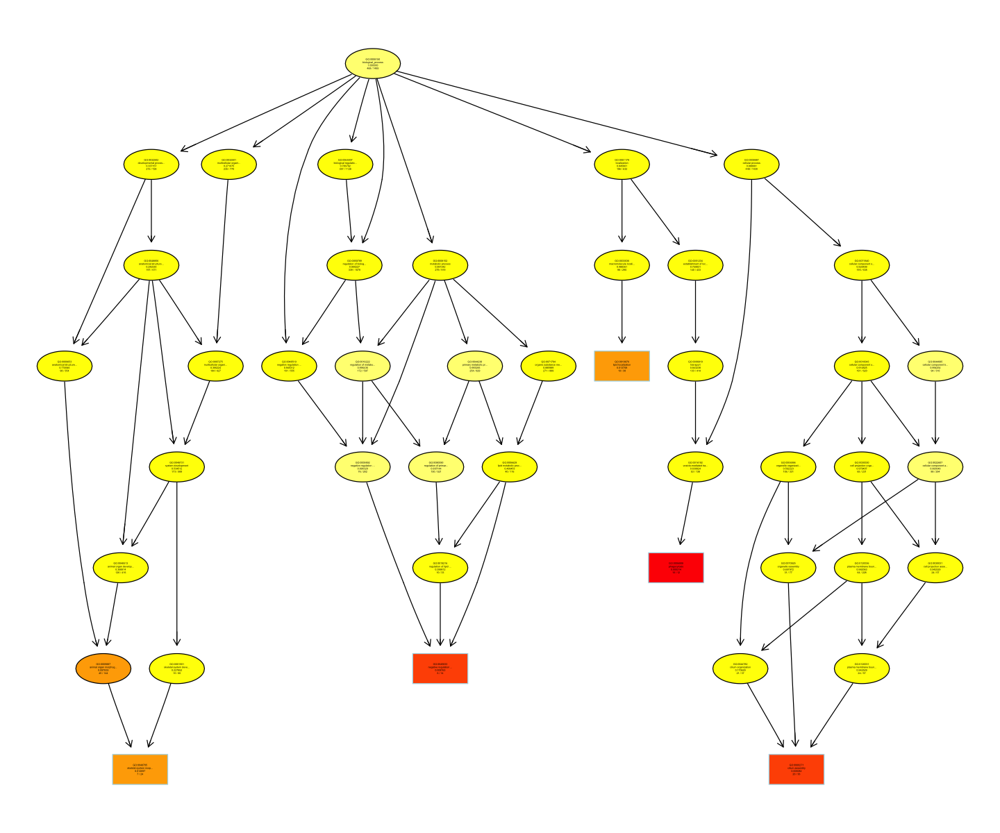

In [100]:
showSigOfNodes(go_results$go_object, scores, firstSigNodes = 5, useInfo = 'all')

In [101]:
go_results$table

,GO.ID,Term,Annotated,Significant,Expected,Rank in classicFisher,classicFisher,classicKS,elimKS
,<chr>,<chr>,<int>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>
1,GO:0006909,phagocytosis,12,10,3.78,1,0.00031,0.00031,0.00031
2,GO:0060271,cilium assembly,36,20,11.35,3,0.00214,0.00608,0.00608
3,GO:0045833,negative regulation of lipid metabolic p...,14,6,4.41,162,0.25835,0.00876,0.00876
4,GO:0048705,skeletal system morphogenesis,24,7,7.56,688,0.67307,0.01270,0.01270
5,GO:0010876,lipid localization,38,19,11.98,6,0.01238,0.01371,0.01371
6,GO:0003158,endothelium development,18,6,5.67,425,0.52245,0.01646,0.01646
7,GO:0006869,lipid transport,29,15,9.14,7,0.01769,0.01738,0.01738
8,GO:0007413,axonal fasciculation,12,5,3.78,194,0.31681,0.02752,0.02752
9,GO:0106030,neuron projection fasciculation,12,5,3.78,195,0.31681,0.02752,0.02752


After combining all the results of the statistical test performed, we obtained the following table with the top 10 significant GO terms. Most of them are related to the lipid activity. One of this GO annotations is related to the neurological activity (`GO:0106030`).

Below we are using function `compareCluster()` from package `clusterProfiler` to compute and visualize differences between GO enrichment of different conditions. It computes results in different manner rather than `topGO`, so we might have slightly different results. Also, we are trying to compare differences between neuron cell from sample treated with vitamin A against the rest of the cells, vitamin A against control and against cells treated with DEAB, but for some reasons it outputs only results only against all cells and cells treated with DEAB.

In [102]:
responce <- all_together(data.clusters_annotated, "Neurons", "Neurons_vitA", against = FALSE, return_p = TRUE)
responce1 <- all_together(data.clusters_annotated, "Neurons", "Neurons_vitA", against = "Neurons_noVitA", 
                          return_p = TRUE)
responce2 <- all_together(data.clusters_annotated, "Neurons", "Neurons_vitA", against = "Neurons_deab", 
                          return_p = TRUE)

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



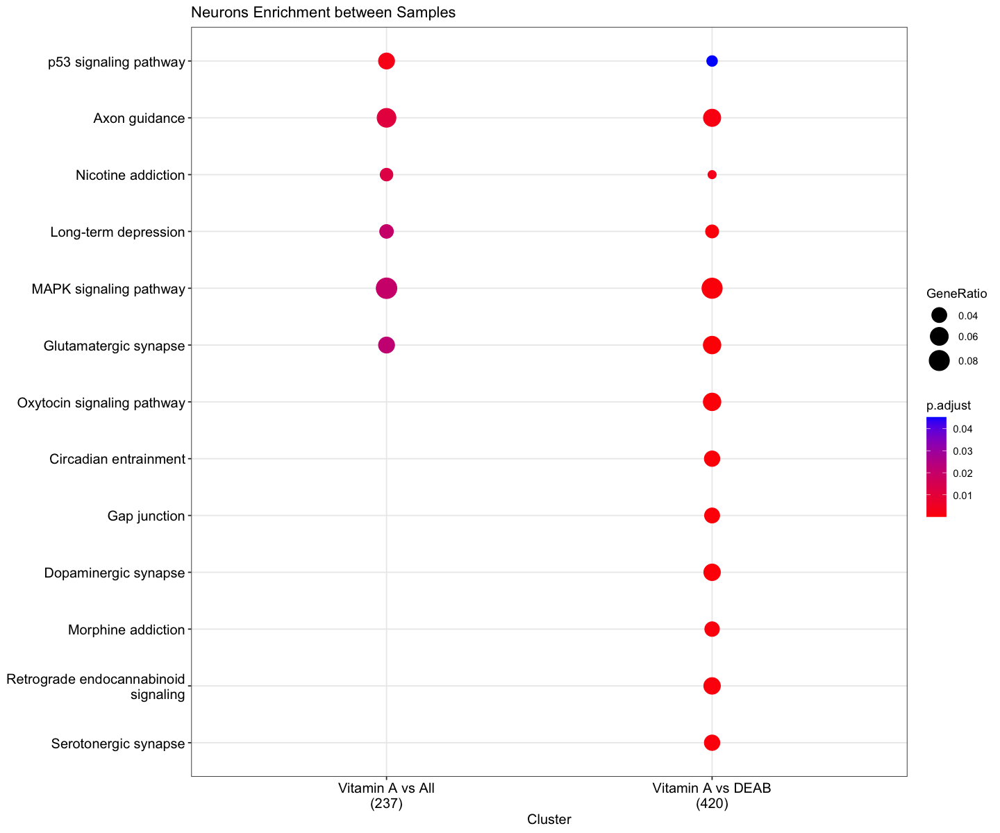

In [103]:
options(repr.plot.width = 12, repr.plot.height = 10)
res1 <- get_aggregated_plots(list(responce, responce1, responce2), 
                             c("Vitamin A vs All", "Vitamin A vs Control", "Vitamin A vs DEAB"),
                             title = "Neurons Enrichment between Samples", showCategory = 10)

# For some reasons plot doesn't include data of "Vitamin A vs Control"

In the plot above we can observe that `clusterProfiler` identified some differences between them. There are some GO terms that are enriched only for the sample treated with DEAB, for the rest we have difference in adjusted p-value. None of them are overlapping with the results reporting in the reference article.

## Conclusion

In this project we made a standard analysis of the single-cell data derived from organoids using one of the field gold standard pipeline implemented in package `Seurat`. We performed quality control, sample integration with acknowledgement for batch-effects, dimensionality reduction, cell clustering and cell type annotation based on the differential expression between clusters. For annotation, we used package `SingleR` with the Human Cell Atlas as a reference. We managed to identify neuron cells in the dataset as they are the main interest of the whole project. Additionally, we found other cell type including different tissues, immune system cells and residues of stem cells from which the organoids originate. Due to the limitations of the annotation used as a reference, we were not able to identify different types of neurons as the authors of the reference paper did. We also performed differential expression analysis with Seurat and found a subset of genes that differ in expression across the samples of interest (Vitamin A, Control, DEAB), though it's not clear how exactly treatment affect samples. In the paper, researchers managed to find how treatment affect certain populations of neurons, but we were able only observe slight differences of spatial organisation of neuron cells between sample on the low-dimensional projections. We also did the pseudobalk differential expression analysis by means of `DESeq2` package, though it didn't yield any results whatsoever. Last step of the project was functional analysis. We used packages `topGO` and `clusterProfiler` for this purpose. We didn't found any neuron development or activity related pathway enrichment.

## Session Information

In [104]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Big Sur 10.16

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRblas.0.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRlapack.dylib

locale:
[1] C/UTF-8/C/C/C/C

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] Rgraphviz_2.38.0            pheatmap_1.0.12            
 [3] cowplot_1.1.1               ggplot2_3.3.5              
 [5] gridExtra_2.3               Matrix_1.4-0               
 [7] tidyr_1.1.4                 tibble_3.1.6               
 [9] dplyr_1.0.7                 clusterProfiler_4.2.0      
[11] hgu95av2.db_3.13.0          org.Hs.eg.db_3.14.0        
[13] DESeq2_1.34.0               ALL_1.36.0                 
[15] topGO_2.46.0                SparseM_1.81               
[17] GO.db_3.14.0                